In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Import Datetime
import datetime

# Import libraries to ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Load the data
# Training data
train_identity_data = pd.read_csv('train_identity.csv')
train_transaction_data = pd.read_csv('train_transaction.csv')

# Testing data
test_identity_data = pd.read_csv('test_identity.csv')
test_transaction_data = pd.read_csv('test_transaction.csv')

In [3]:
# Check the size of all the loaded data
print("Train Identity Shape:", train_identity_data.shape)
print("Train Transaction Shape:", train_transaction_data.shape)
print()
print("Test Identity Shape:", test_identity_data.shape)
print("Test Transaction Shape:", test_transaction_data.shape)

Train Identity Shape: (144233, 41)
Train Transaction Shape: (590540, 394)

Test Identity Shape: (141907, 41)
Test Transaction Shape: (506691, 393)


In [4]:
train_identity_data.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987004,0.0,70787.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,samsung browser 6.2,32.0,2220x1080,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M
1,2987008,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,...,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device
2,2987010,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,Windows
3,2987011,-5.0,221832.0,NaN,NaN,0.0,-6.0,NaN,NaN,NaN,...,chrome 62.0,NaN,NaN,NaN,F,F,T,T,desktop,NaN
4,2987016,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,...,chrome 62.0,24.0,1280x800,match_status:2,T,F,T,T,desktop,MacOS


In [5]:
train_transaction_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
test_identity_data.head()

,TransactionID,id-01,id-02,id-03,id-04,id-05,id-06,id-07,id-08,id-09,...,id-31,id-32,id-33,id-34,id-35,id-36,id-37,id-38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW


In [7]:
# Rename columns by replacing '-' with '_'
test_identity_data.columns = test_identity_data.columns.str.replace('-', '_')

In [8]:
test_identity_data.head()

,TransactionID,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,...,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3663586,-45.0,280290.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
1,3663588,0.0,3579.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,24.0,1280x720,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T
2,3663597,-5.0,185210.0,NaN,NaN,1.0,0.0,NaN,NaN,NaN,...,ie 11.0 for tablet,NaN,NaN,NaN,F,T,T,F,desktop,Trident/7.0
3,3663601,-45.0,252944.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13
4,3663602,-95.0,328680.0,NaN,NaN,7.0,-33.0,NaN,NaN,NaN,...,chrome 67.0 for android,NaN,NaN,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW


In [9]:
train_identity_data.dtypes

TransactionID      int64
id_01            float64
id_02            float64
id_03            float64
id_04            float64
id_05            float64
id_06            float64
id_07            float64
id_08            float64
id_09            float64
id_10            float64
id_11            float64
id_12             object
id_13            float64
id_14            float64
id_15             object
id_16             object
id_17            float64
id_18            float64
id_19            float64
id_20            float64
id_21            float64
id_22            float64
id_23             object
id_24            float64
id_25            float64
id_26            float64
id_27             object
id_28             object
id_29             object
id_30             object
id_31             object
id_32            float64
id_33             object
id_34             object
id_35             object
id_36             object
id_37             object
id_38             object
DeviceType        object


Categorical Features - Identity

1. DeviceType
2. DeviceInfo
3. id_12 - id_38


In [10]:
# Here we confirm that all of the transactions by setting the reference to TransactionID
common_transID_train = np.sum(train_transaction_data['TransactionID'].isin(train_identity_data['TransactionID'].unique()))
common_transID_test = np.sum(test_transaction_data['TransactionID'].isin(test_identity_data['TransactionID'].unique()))

# Calculate the percentages
transID_train_perc = (common_transID_train / len(train_transaction_data) * 100).round(2)
transID_test_perc = (common_transID_test / len(test_transaction_data) * 100).round(2)

# Print the solution
print(f"{transID_train_perc}% of TransactionIDs from train_transaction_data have corresponding train_identity_data records, totaling {common_transID_train} transactions.")
print(f"{transID_test_perc}% of TransactionIDs from test_transaction_data have corresponding test_identity_data records, totaling {common_transID_test} transactions.")

24.42% of TransactionIDs from train_transaction_data have corresponding train_identity_data records, totaling 144233 transactions.
28.01% of TransactionIDs from test_transaction_data have corresponding test_identity_data records, totaling 141907 transactions.


In [14]:
num_cols_id = train_identity_data[[f'id_{i:02d}' for i in range(1, 12)]]

In [15]:
print(num_cols_id)

        id_01     id_02  id_03  id_04  id_05  id_06  id_07  id_08  id_09  \
0         0.0   70787.0    NaN    NaN    NaN    NaN    NaN    NaN    NaN   
1        -5.0   98945.0    NaN    NaN    0.0   -5.0    NaN    NaN    NaN   
2        -5.0  191631.0    0.0    0.0    0.0    0.0    NaN    NaN    0.0   
3        -5.0  221832.0    NaN    NaN    0.0   -6.0    NaN    NaN    NaN   
4         0.0    7460.0    0.0    0.0    1.0    0.0    NaN    NaN    0.0   
...       ...       ...    ...    ...    ...    ...    ...    ...    ...   
144228  -15.0  145955.0    0.0    0.0    0.0    0.0    NaN    NaN    0.0   
144229   -5.0  172059.0    NaN    NaN    1.0   -5.0    NaN    NaN    NaN   
144230  -20.0  632381.0    NaN    NaN   -1.0  -36.0    NaN    NaN    NaN   
144231   -5.0   55528.0    0.0    0.0    0.0   -7.0    NaN    NaN    0.0   
144232  -45.0  339406.0    NaN    NaN  -10.0 -100.0    NaN    NaN    NaN   

        id_10  id_11  
0         NaN  100.0  
1         NaN  100.0  
2         0.0  100

In [16]:
cat_cols_train_identity = train_identity_data[['DeviceType', 'DeviceInfo'] + [f'id_{i}' for i in range(12, 39)]]

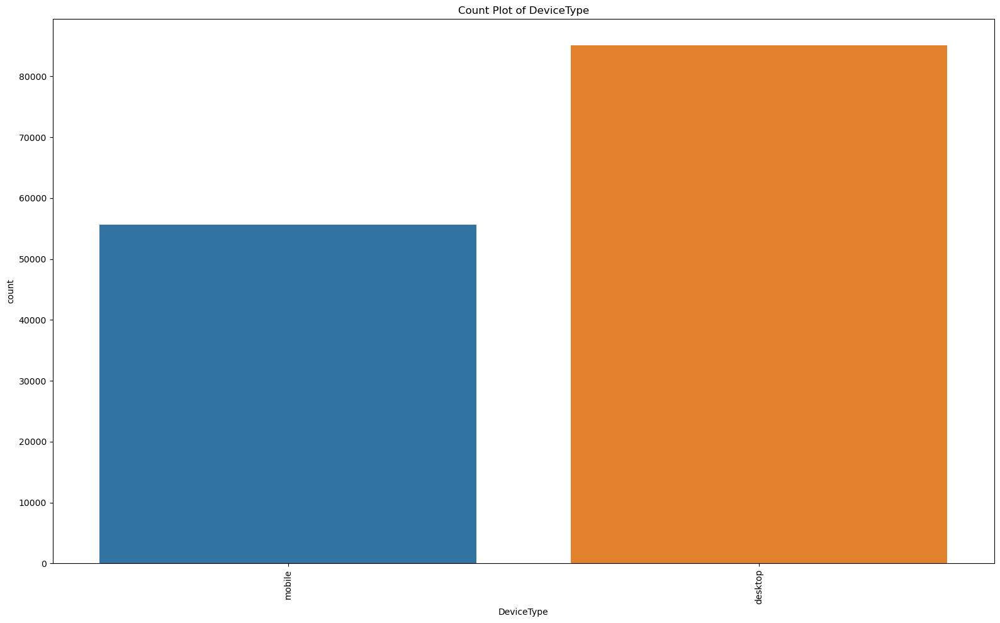

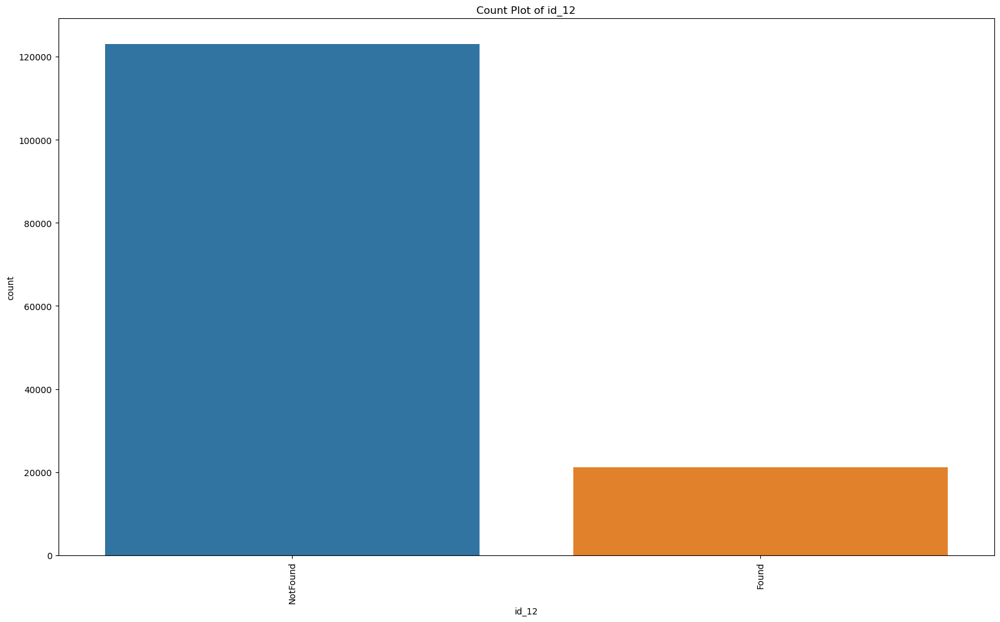

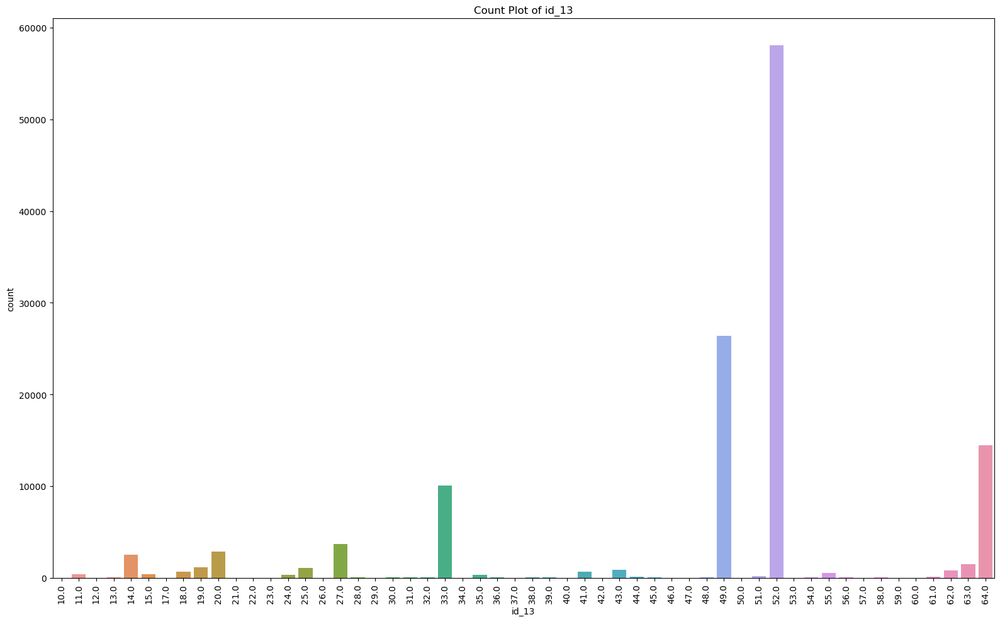

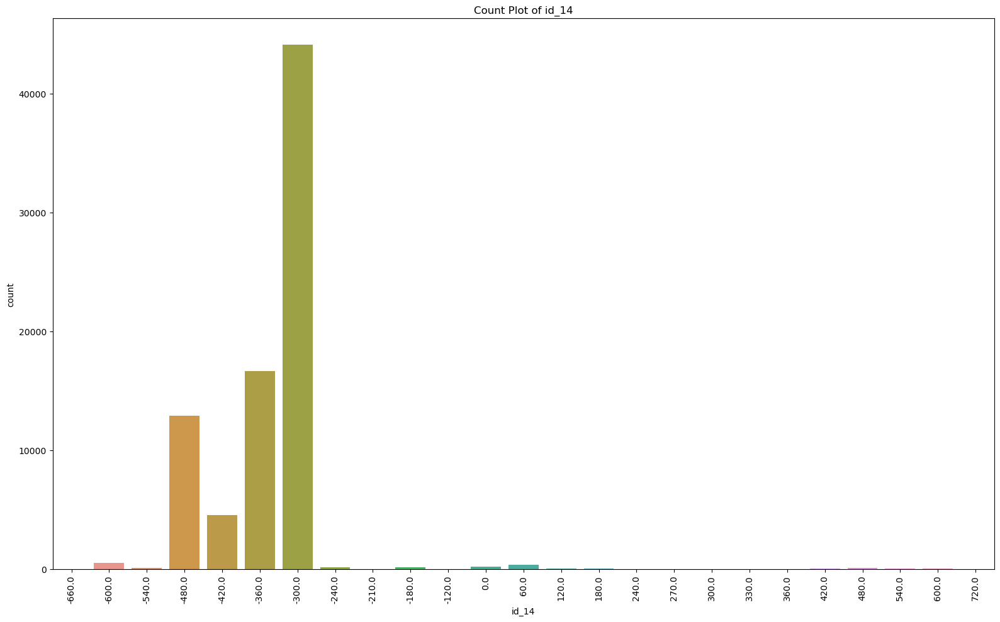

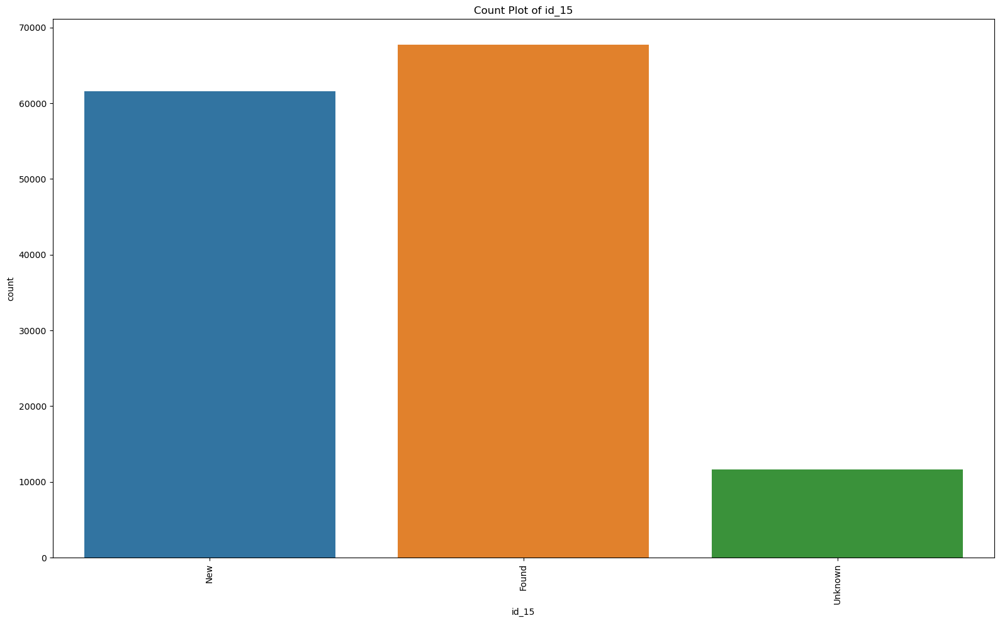

...

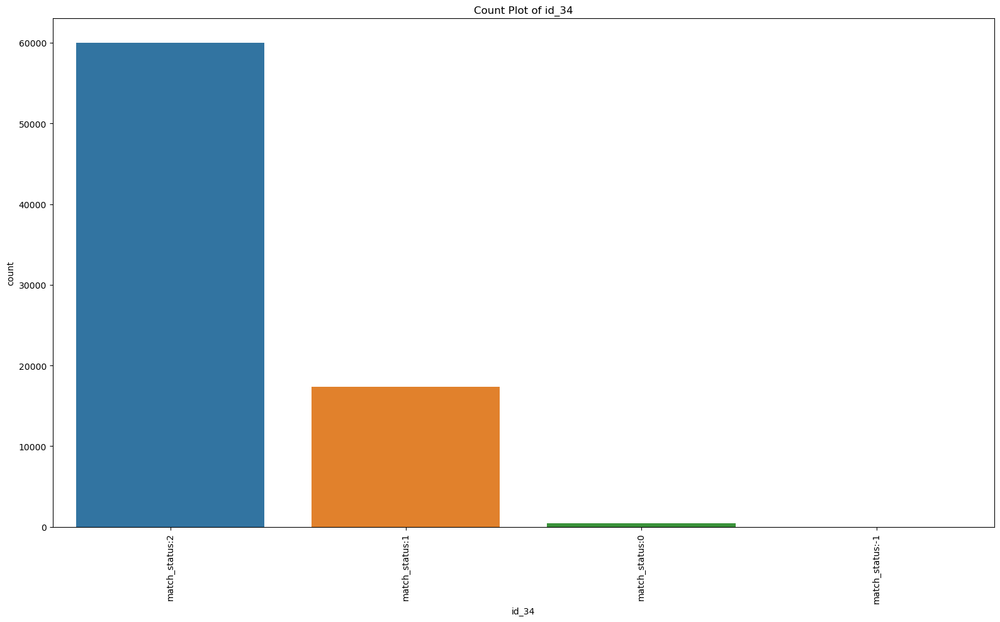

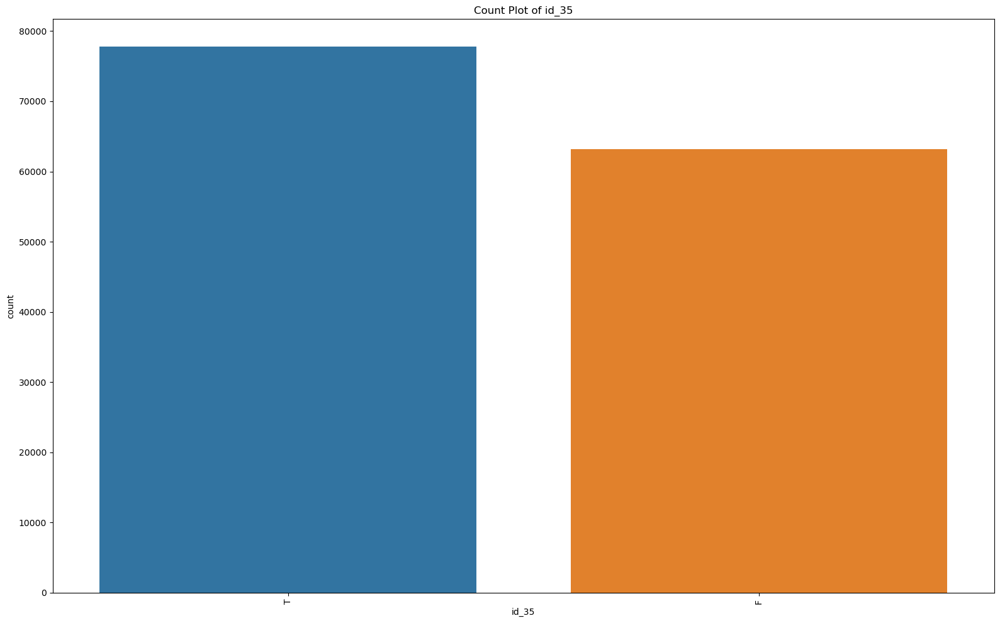

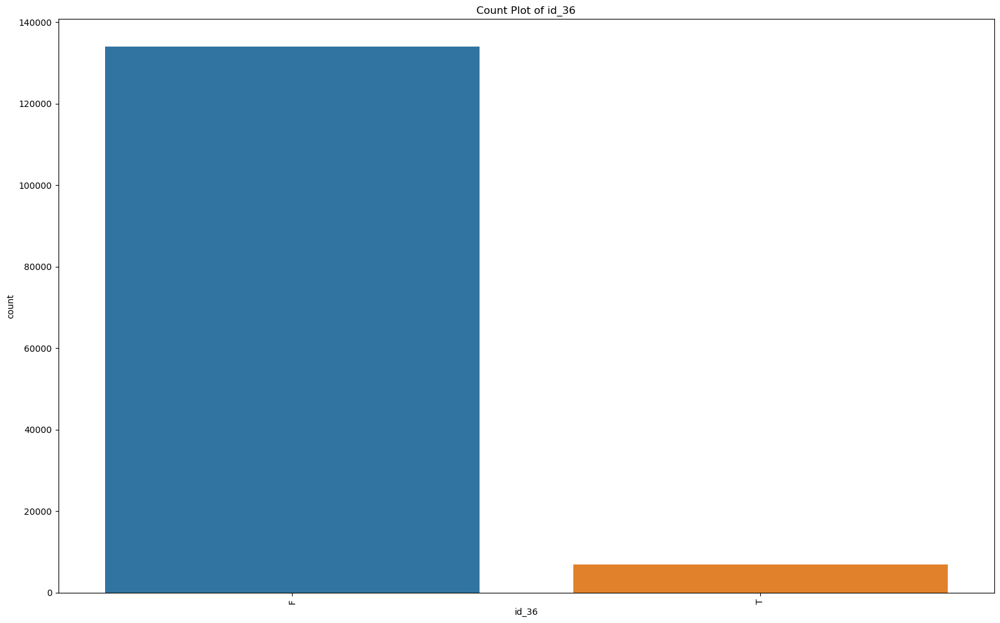

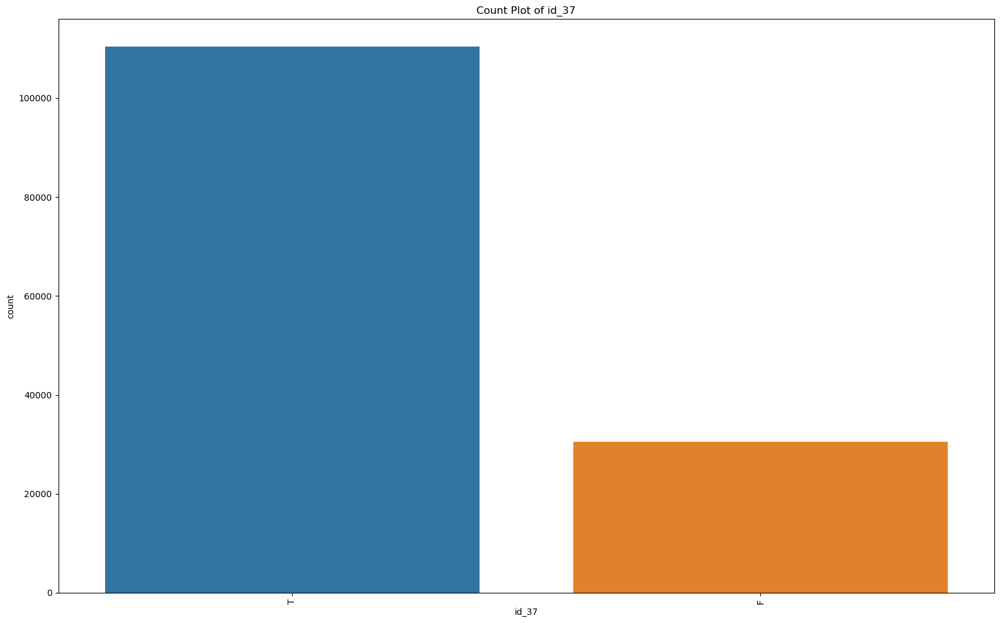

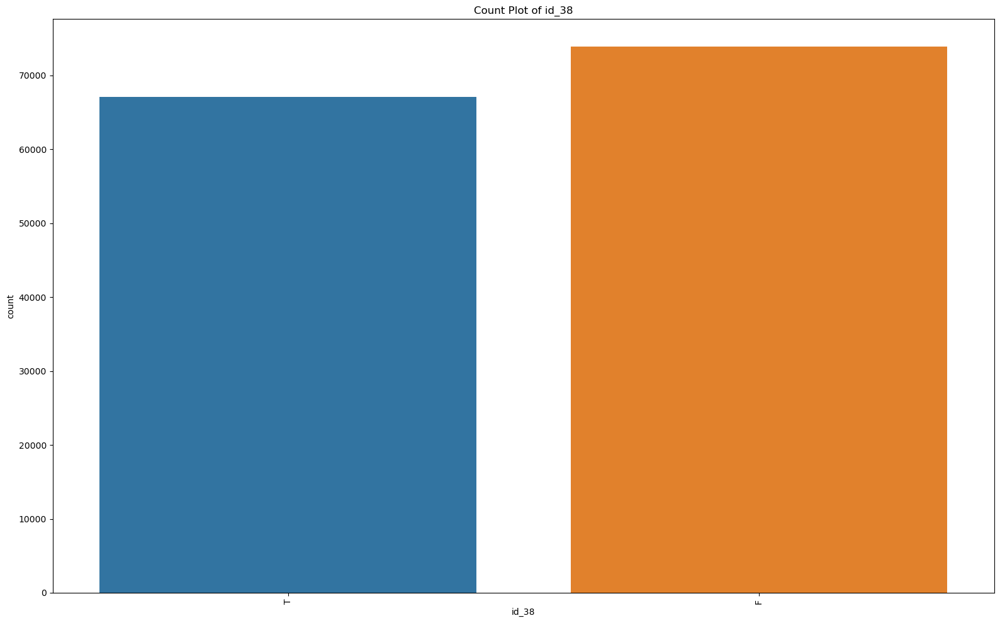

In [18]:
# List of categorical columns to plot
cat_cols_to_plot = [col for col in cat_cols_train_identity if col != "DeviceInfo"]

for feature in cat_cols_to_plot:
    plt.figure(figsize=(16, 10))  # Set the figure size for each plot
    
    sns.countplot(data=train_identity_data, x=feature)
    plt.title(f"Count Plot of {feature}")
    plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()

In [12]:
train_identity_data[cat_cols_to_plot].describe()

,id_13,id_14,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
count,127320.000000,80044.000000,139369.000000,45113.000000,139318.000000,139261.000000,5159.000000,5169.000000,4747.000000,5132.000000,5163.000000,77586.000000
mean,48.053071,-344.507146,189.451377,14.237337,353.128174,403.882666,368.269820,16.002708,12.800927,329.608924,149.070308,26.508597
std,11.774858,93.695502,30.375360,1.561302,141.095343,152.160327,198.847038,6.897665,2.372447,97.461089,32.101995,3.737502
min,10.000000,-660.000000,100.000000,10.000000,100.000000,100.000000,100.000000,10.000000,11.000000,100.000000,100.000000,0.000000
25%,49.000000,-360.000000,166.000000,13.000000,266.000000,256.000000,252.000000,14.000000,11.000000,321.000000,119.000000,24.000000
50%,52.000000,-300.000000,166.000000,15.000000,341.000000,472.000000,252.000000,14.000000,11.000000,321.000000,149.000000,24.000000
75%,52.000000,-300.000000,225.000000,15.000000,427.000000,533.000000,486.500000,14.000000,15.000000,371.000000,169.000000,32.000000
max,64.000000,720.000000,229.000000,29.000000,671.000000,661.000000,854.000000,44.000000,26.000000,548.000000,216.000000,32.000000


In [13]:
train_identity_data[cat_cols_to_plot].describe(include='all')

,DeviceType,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,...,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38
count,140810,144233,127320.000000,80044.000000,140985,129340,139369.000000,45113.000000,139318.000000,139261.000000,...,140978,77565,140282,77586.000000,73289,77805,140985,140985,140985,140985
unique,2,2,NaN,NaN,3,2,NaN,NaN,NaN,NaN,...,2,75,130,NaN,260,4,2,2,2,2
top,desktop,NotFound,NaN,NaN,Found,Found,NaN,NaN,NaN,NaN,...,Found,Windows 10,chrome 63.0,NaN,1920x1080,match_status:2,T,F,T,F
freq,85165,123025,NaN,NaN,67728,66324,NaN,NaN,NaN,NaN,...,74926,21155,22000,NaN,16874,60011,77814,134066,110452,73922
mean,NaN,NaN,48.053071,-344.507146,NaN,NaN,189.451377,14.237337,353.128174,403.882666,...,NaN,NaN,NaN,26.508597,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,11.774858,93.695502,NaN,NaN,30.375360,1.561302,141.095343,152.160327,...,NaN,NaN,NaN,3.737502,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,10.000000,-660.000000,NaN,NaN,100.000000,10.000000,100.000000,100.000000,...,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,49.000000,-360.000000,NaN,NaN,166.000000,13.000000,266.000000,256.000000,...,NaN,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,52.000000,-300.000000,NaN,NaN,166.000000,15.000000,341.000000,472.000000,...,NaN,NaN,NaN,24.000000,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,52.000000,-300.000000,NaN,NaN,225.000000,15.000000,427.000000,533.000000,...,NaN,NaN,NaN,32.000000,NaN,NaN,NaN,NaN,NaN,NaN


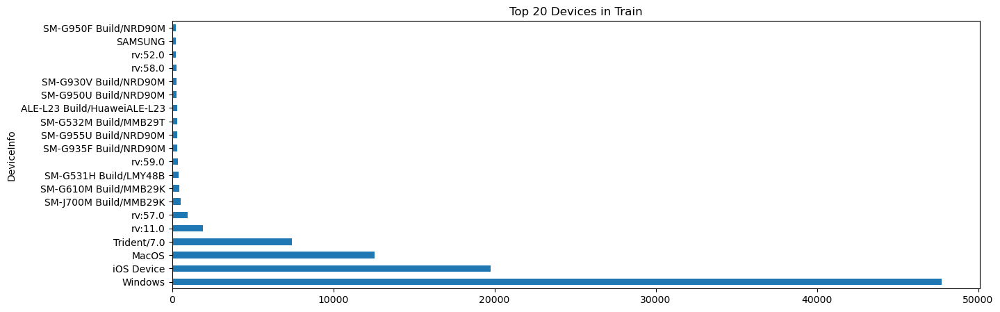

In [14]:
top_devices = (
    train_identity_data.groupby('DeviceInfo')
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(20)
)

top_devices.plot(kind='barh', figsize=(15, 5), title='Top 20 Devices in Train')
plt.show()


In [15]:
# Define a function to map values to 'DeviceInfo_new'
def map_device_info(value):
    if pd.isna(value):
        return 'Missing'  # Replace NaN values with 'Unknown' or any default value you prefer
    elif value.startswith(('SM-', 'Samsung', 'SAMSUNG', 'GT', 'A9', 'TAB7')):    
        return 'SAMSUNG'
    elif value.startswith(('Moto', 'moto')):
        return 'Motorola'
    elif value.startswith('LG'):
        return 'LG'
    elif value.startswith(('ASUS', 'Z970')):
        return 'ASUS'
    elif value.startswith(('Alcatel', 'ALCATEL')):
        return 'ALCATEL'
    elif value.startswith(('POCO', 'M3', 'M4', 'm3', 'm4')):
        return 'POCO'
    elif value.startswith(('Trident', 'TRIDENT')):
        return 'TRIDENT'
    elif value.startswith(('LAVA', 'Lava')):
        return 'LAVA'
    elif value.startswith('Hisense'):
        return 'Hisense'
    elif value.startswith('Lenovo'):
        return 'Lenovo'
    elif value.startswith('HTC'):
        return 'HTC'
    elif 'Huawei' in value or 'HUAWEI' in value or 'ALE-' in value or '-L' in value:
        return 'HUAWEI'
    elif 'Linux' in value or 'LINUX' in value:
        return 'Linux'
    elif 'rv:' in value or 'RV:' in value:
        return 'RV'
    elif value.startswith(('ZTE', 'Blade', 'BLADE')):
        return 'ZTE'
    elif value.startswith(('PIXEL', 'Pixel')):
        return 'PIXEL'
    elif value.startswith(('Ilium', 'ILIUM')):
        return 'Ilium'
    elif value.startswith(('Win', 'WIN')):
        return 'Windows'
    elif value.startswith(('Redmi', 'REDMI', 'MI', 'Mi')):
        return 'MI'
    elif value.startswith(('Nexus', 'NEXUS')):
        return 'Nexus'
    elif value.startswith(('XT', 'xt')):
        return 'XT'
    elif value.startswith('Android'):
        return 'Android'
    elif 'LT22i' in value or 'LT30p' in value or 'D53' in value or 'E53' in value or 'E23' in value or 'E56' in value  or 'E66' in value or 'D66' in value or 'E65' in value or 'E68' in value or 'E58' in value or 'D65' in value or 'G81' in value or 'C66' in value or 'G33' in value or 'G63' in value or 'G32' in value or 'G31' in value or 'F53' in value or 'F51' in value or 'F83' in value or 'F31' in value or 'F32' in value or 'F33' in value:
        return 'SONY'
    else:
        return value

# Create a new column 'DeviceInfo_new' and initialize it with an empty string
train_identity_data['DeviceInfo_new'] = ''

# Apply the mapping function to 'DeviceInfo' column and create 'DeviceInfo_new' column
train_identity_data['DeviceInfo_new'] = train_identity_data['DeviceInfo'].apply(map_device_info)

# Print the result
print(train_identity_data[['DeviceInfo', 'DeviceInfo_new']])

                                DeviceInfo       DeviceInfo_new
0            SAMSUNG SM-G892A Build/NRD90M              SAMSUNG
1                               iOS Device           iOS Device
2                                  Windows              Windows
3                                      NaN              Missing
4                                    MacOS                MacOS
...                                    ...                  ...
144228             F3111 Build/33.3.A.1.97                 SONY
144229                 A574BL Build/NMF26F  A574BL Build/NMF26F
144230  Moto E (4) Plus Build/NMA26.42-152             Motorola
144231                               MacOS                MacOS
144232         RNE-L03 Build/HUAWEIRNE-L03               HUAWEI

[144233 rows x 2 columns]


In [16]:
train_identity_data['DeviceInfo_new'].nunique()

499

In [17]:
# Create a new column 'DeviceInfo_new' and initialize it with an empty string
test_identity_data['DeviceInfo_new'] = ''

# Apply the mapping function to 'DeviceInfo' column and create 'DeviceInfo_new' column
test_identity_data['DeviceInfo_new'] = test_identity_data['DeviceInfo'].apply(map_device_info)

# Print the result
print(test_identity_data[['DeviceInfo', 'DeviceInfo_new']])

                         DeviceInfo DeviceInfo_new
0       MYA-L13 Build/HUAWEIMYA-L13         HUAWEI
1              LGLS676 Build/MXB48T             LG
2                       Trident/7.0        TRIDENT
3       MYA-L13 Build/HUAWEIMYA-L13         HUAWEI
4              SM-G9650 Build/R16NW        SAMSUNG
...                             ...            ...
141902                     SM-J700M        SAMSUNG
141903                     SM-J320M        SAMSUNG
141904                   iOS Device     iOS Device
141905  ALE-L23 Build/HuaweiALE-L23         HUAWEI
141906                      SAMSUNG        SAMSUNG

[141907 rows x 2 columns]


In [18]:
# Define a function to map values to 'id_30_new'
def map_id_30(value):
    if pd.isna(value):
        return 'Missing' 
    value = value.lower()
    if 'windows' in value:
        return 'Windows'
    elif 'linux' in value:
        return 'Linux'
    elif 'android' in value:
        return 'Android'
    elif any(keyword in value for keyword in ['mac os', 'macos', 'mac']):
        return 'Mac OS'
    elif any(keyword in value for keyword in ['ios', 'iOS']):
        return 'iOS'
    else:
        return value

# Create a new column 'id_30_new' and initialize it with an empty string
train_identity_data['id_30_new'] = ''

# Apply the mapping function to 'id_30' column and create 'id_30_new' column
train_identity_data['id_30_new'] = train_identity_data['id_30'].apply(map_id_30)

# Print the result
print(train_identity_data[['id_30', 'id_30_new']])

                   id_30 id_30_new
0            Android 7.0   Android
1             iOS 11.1.2       iOS
2                    NaN   Missing
3                    NaN   Missing
4       Mac OS X 10_11_6    Mac OS
...                  ...       ...
144228               NaN   Missing
144229     Android 7.1.1   Android
144230               NaN   Missing
144231   Mac OS X 10_9_5    Mac OS
144232               NaN   Missing

[144233 rows x 2 columns]


In [19]:
train_identity_data['id_30_new'].unique()

array(['Android', 'iOS', 'Missing', 'Mac OS', 'Windows', 'Linux', 'func',
       'other'], dtype=object)

In [20]:
# Create a new column 'id_31_new' and initialize it with an empty string
test_identity_data['id_30_new'] = ''

# Apply the mapping function to 'id_31' column and create 'id_31_new' column
test_identity_data['id_30_new'] = test_identity_data['id_30'].apply(map_id_30)

# Print the result
print(test_identity_data[['id_30', 'id_30_new']])

                id_30 id_30_new
0                 NaN   Missing
1       Android 6.0.1   Android
2                 NaN   Missing
3                 NaN   Missing
4                 NaN   Missing
...               ...       ...
141902            NaN   Missing
141903            NaN   Missing
141904     iOS 10.3.3       iOS
141905            NaN   Missing
141906            NaN   Missing

[141907 rows x 2 columns]


In [21]:
def map_id_31(value):
    if pd.isna(value):
        return 'Missing'  # Replace NaN values with 'Missing' or any default value you prefer
    value = str(value).lower()
    if 'chrome' in value and 'mobile' in value:
        return 'Chrome Mobile'
    elif 'chrome' in value and 'android' in value:
        return 'Chrome Android'
    elif 'chrome' in value and 'ios' in value:
        return 'Chrome iOS'
    elif 'chrome' in value:
        return 'Chrome'
    elif 'firefox' in value and 'mobile' in value:
        return 'Firefox Mobile'
    elif 'firefox' in value:
        return 'Firefox'
    elif 'safari' in value and 'mobile' in value:
        return 'Safari Mobile'
    elif 'safari' in value:
        return 'Safari'
    elif 'samsung browser' in value:
        return 'Samsung Browser'
    elif 'samsung' in value:
        return 'Samsung'
    elif 'edge' in value:
        return 'Edge'
    elif 'ie' in value and 'tablet' in value:
        return 'IE Tablet'
    elif 'ie' in value and 'desktop' in value:
        return 'IE Desktop'
    elif 'ie' in value:
        return 'IE'
    elif 'opera' in value:
        return 'Opera'
    elif 'google' in value:
        return 'Google'
    elif 'android' in value:
        return 'Android'
    else:
        return value

# Create a new column 'id_31_new' and initialize it with an empty string
train_identity_data['id_31_new'] = ''

# Apply the mapping function to 'id_31' column and create 'id_31_new' column
train_identity_data['id_31_new'] = train_identity_data['id_31'].apply(map_id_31)

# Print the result
print(train_identity_data[['id_31', 'id_31_new']])

                          id_31        id_31_new
0           samsung browser 6.2  Samsung Browser
1            mobile safari 11.0    Safari Mobile
2                   chrome 62.0           Chrome
3                   chrome 62.0           Chrome
4                   chrome 62.0           Chrome
...                         ...              ...
144228  chrome 66.0 for android   Chrome Android
144229  chrome 55.0 for android   Chrome Android
144230  chrome 65.0 for android   Chrome Android
144231              chrome 66.0           Chrome
144232  chrome 66.0 for android   Chrome Android

[144233 rows x 2 columns]


In [22]:
train_identity_data['id_31_new'].unique()

array(['Samsung Browser', 'Safari Mobile', 'Chrome', 'Missing',
       'Chrome Android', 'Edge', 'Safari', 'Firefox', 'Chrome iOS',
       'IE Desktop', 'IE Tablet', 'other', 'IE', 'Opera', 'Android',
       'mobile', 'Samsung', 'aol', 'silk', 'waterfox', 'nokia/lumia',
       'puffin', 'microsoft/windows', 'cyberfox', 'zte/blade', 'palemoon',
       'maxthon', 'line', 'lg/k-200', 'iron', 'blu/dash', 'seamonkey',
       'm4tel/m4', 'comodo', 'lanix/ilium', 'chromium', 'inco/minion',
       'cherry', 'icedragon', 'Google', 'facebook', 'Firefox Mobile'],
      dtype=object)

In [23]:
train_identity_data['id_31_new'].nunique()

42

In [24]:
# Create a new column 'id_31_new' and initialize it with an empty string
test_identity_data['id_31_new'] = ''

# Apply the mapping function to 'id_31' column and create 'id_31_new' column
test_identity_data['id_31_new'] = test_identity_data['id_31'].apply(map_id_31)

# Print the result
print(test_identity_data[['id_31', 'id_31_new']])

                          id_31        id_31_new
0       chrome 67.0 for android   Chrome Android
1       chrome 67.0 for android   Chrome Android
2            ie 11.0 for tablet        IE Tablet
3       chrome 67.0 for android   Chrome Android
4       chrome 67.0 for android   Chrome Android
...                         ...              ...
141902  chrome 71.0 for android   Chrome Android
141903  chrome 71.0 for android   Chrome Android
141904       mobile safari 10.0    Safari Mobile
141905  chrome 43.0 for android   Chrome Android
141906      samsung browser 8.2  Samsung Browser

[141907 rows x 2 columns]


In [25]:
test_identity_data['id_31_new'].unique()

array(['Chrome Android', 'IE Tablet', 'Safari Mobile', 'Chrome',
       'IE Desktop', 'Edge', 'Missing', 'Firefox', 'Samsung Browser',
       'Safari', 'Chrome iOS', 'Google', 'Firefox Mobile', 'other', 'IE',
       'Samsung', 'Opera', 'Android', 'facebook', 'mobile', 'rim',
       'palemoon', 'uc', 'blackberry'], dtype=object)

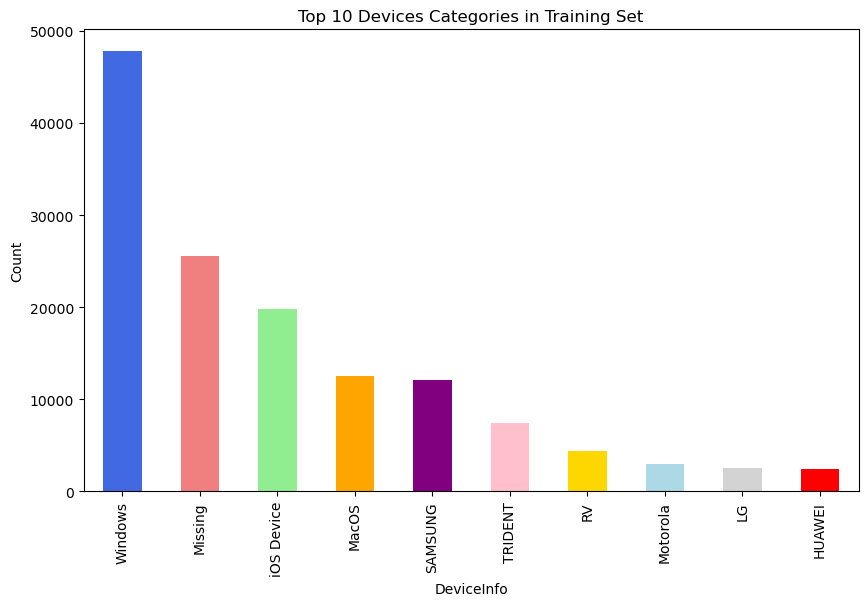

In [26]:
import matplotlib.pyplot as plt

# Group and count devices
top_devices = (
    train_identity_data.groupby('DeviceInfo_new')
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(10)
)

# Define a list of colors for the bars
colors = ['royalblue', 'lightcoral', 'lightgreen', 'orange', 'purple', 'pink', 'gold', 'lightblue', 'lightgray', 'red']

# Create a vertical bar chart
top_devices.plot(kind='bar', figsize=(10, 6), title='Top 10 Devices Categories in Training Set', color=colors)

# Add labels to the bars
plt.xlabel('DeviceInfo')
plt.ylabel('Count')

# Show the plot
plt.show()

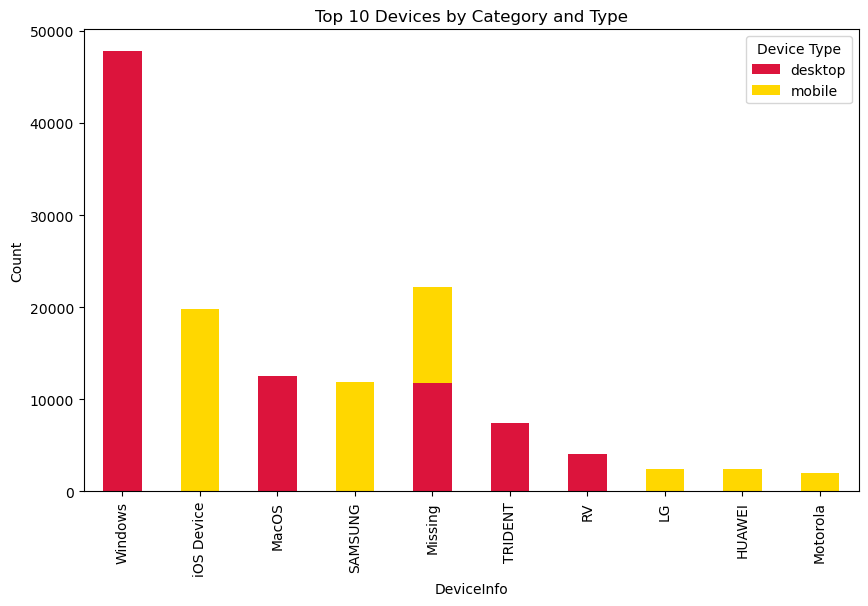

In [27]:
# Group and count devices by 'DeviceInfo_new' and 'DeviceType'
top_devices_type = (
    train_identity_data.groupby(['DeviceInfo_new', 'DeviceType'])
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(11)
)

# Create a vertical bar chart
top_devices_type.unstack().plot(kind='bar', stacked=True, figsize=(10, 6), 
                                title='Top 10 Devices by Category and Type', 
                                color=['crimson', 'gold'])

# Add labels to the bars
plt.xlabel('DeviceInfo')
plt.ylabel('Count')

# Show the plot
plt.legend(title='Device Type')
plt.show()

In [28]:
# Calculate the total counts for Mobile and Desktop
total_mobile = top_devices_type.xs('mobile', level='DeviceType').sum()
total_desktop = top_devices_type.xs('desktop', level='DeviceType').sum()

# Calculate the total count
total_count = top_devices_type.sum()

# Calculate the percentages
percentage_mobile = (total_mobile / total_count) * 100
percentage_desktop = (total_desktop / total_count) * 100

print(f'Total Mobile Usage: {percentage_mobile:.2f}%')
print(f'Total Desktop Usage: {percentage_desktop:.2f}%')


Total Mobile Usage: 36.98%
Total Desktop Usage: 63.02%


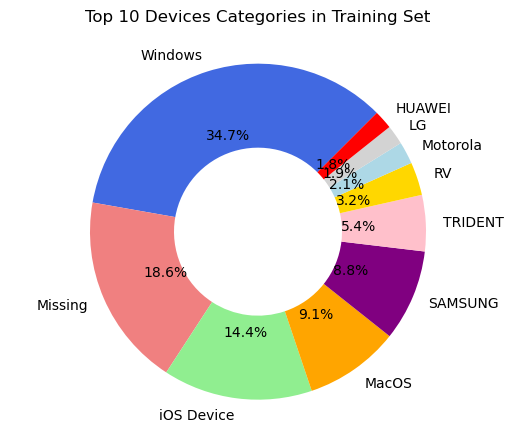

In [29]:
import matplotlib.pyplot as plt

# Group and count devices
top_devices = (
    train_identity_data.groupby('DeviceInfo_new')
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(10)
)

# Define a list of colors for the wedges
colors = ['royalblue', 'lightcoral', 'lightgreen', 'orange', 'purple', 'pink', 'gold', 'lightblue', 'lightgray', 'red']

# Create a figure and axis
fig, ax = plt.subplots()

# Create a pie chart with a white circle in the center to convert it into a donut chart
ax.pie(top_devices, labels=top_devices.index, autopct='%1.1f%%', startangle=45, colors=colors, wedgeprops=dict(width=0.5))

# Add a white circle in the center to create a donut chart
centre_circle = plt.Circle((0,0),0.10,fc='white')
fig.gca().add_artist(centre_circle)

# Add a title
ax.set_title('Top 10 Devices Categories in Training Set\n')

# Equal aspect ratio ensures that pie is drawn as a circle
ax.axis('equal')

# Show the plot
plt.show()


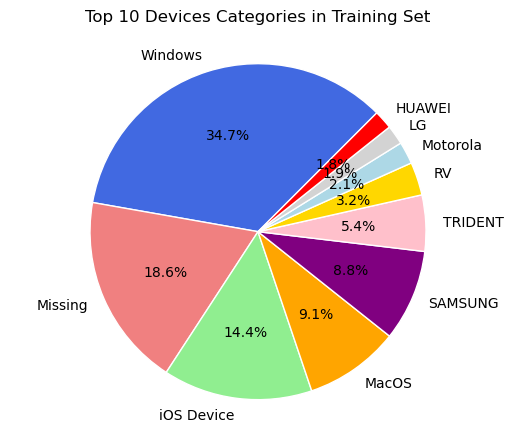

In [30]:
import matplotlib.pyplot as plt

# Group and count devices
top_devices = (
    train_identity_data.groupby('DeviceInfo_new')
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(10)
)

# Define a list of colors for the wedges
colors = ['royalblue', 'lightcoral', 'lightgreen', 'orange', 'purple', 'pink', 'gold', 'lightblue', 'lightgray', 'red']

# Create a figure and axis
fig, ax = plt.subplots()

# Create a pie chart without the inner white circle
ax.pie(top_devices, labels=top_devices.index, autopct='%1.1f%%', startangle=45, colors=colors, wedgeprops={'linewidth': 1, 'edgecolor': 'white'})

# Add a title
ax.set_title('Top 10 Devices Categories in Training Set\n')

# Equal aspect ratio ensures that pie is drawn as a circle
ax.axis('equal')

# Show the plot
plt.show()


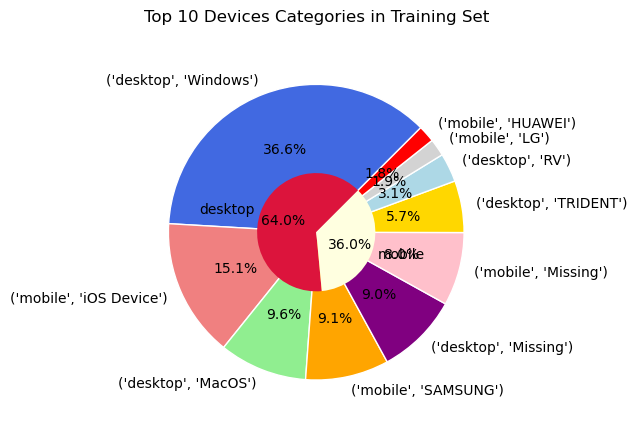

In [31]:
import matplotlib.pyplot as plt

# Group and count devices by 'DeviceInfo_new' and 'DeviceType'
top_devices_type = (
    train_identity_data.groupby(['DeviceType', 'DeviceInfo_new'])
    ['TransactionID']
    .count()
    .sort_values(ascending=False)
    .head(10)
)

# Define a list of colors for the inner wedges
colors_inner = ['royalblue', 'lightcoral', 'lightgreen', 'orange', 'purple', 'pink', 'gold', 'lightblue', 'lightgray', 'red']

# Create a figure and axis
fig, ax = plt.subplots()

# Create the inner pie chart without the inner white circle
ax.pie(top_devices_type, labels=top_devices_type.index, autopct='%1.1f%%', startangle=45, colors=colors_inner, wedgeprops={'linewidth': 1, 'edgecolor': 'white'})

# Add a title
ax.set_title('Top 10 Devices Categories in Training Set\n')

# Equal aspect ratio ensures that the inner pie is drawn as a circle
ax.axis('equal')

# Create an outer pie chart for 'DeviceType' category
#outer_labels = top_devices_type.index.get_level_values('DeviceType').unique()
outer_labels = top_devices_type.index.get_level_values('DeviceType').unique()
outer_sizes = top_devices_type.groupby('DeviceType').sum()
outer_colors = ['crimson', 'lightyellow']  # Colors for the outer pie wedges

# Create the outer pie chart
ax.pie(outer_sizes, labels=outer_labels, autopct='%1.1f%%', startangle=45, colors=outer_colors, radius=0.4)

# Show the plot
plt.show()

In [32]:
# Specify the file path where you want to save the CSV file
file_path = "train_identity_data.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
train_identity_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")


DataFrame exported to train_identity_data.csv


In [33]:
# Specify the file path where you want to save the CSV file
file_path = "test_identity_data.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
test_identity_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")


DataFrame exported to test_identity_data.csv


In [34]:
train_transaction_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
test_transaction_data.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3663551,18403310,171.00,W,4476,574.0,150.0,visa,226.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3663552,18403310,284.95,W,10989,360.0,150.0,visa,166.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3663553,18403317,67.95,W,18018,452.0,150.0,mastercard,117.0,debit,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Categorical Features - Transaction

1. ProductCD
3. card1 - card6
4. addr1, addr2
5. P_emaildomain
6. R_emaildomain
7. M1 - M9

In [36]:
# https://www.kaggle.com/c/ieee-fraud-detection/discussion/100400#latest-579480

# Define the START_DATE
#START_DATE = '2017-12-01'
#startdate = datetime.datetime.strptime(START_DATE, "%Y-%m-%d")

# Define a function to apply date transformation
#def transform_date(df):
#    df["Date"] = df['TransactionDT'].apply(lambda x: (startdate + datetime.timedelta(seconds=x)))
#    df['_Weekdays'] = df['Date'].dt.dayofweek
#    df['_Hours'] = df['Date'].dt.hour
#    df['_Days'] = df['Date'].dt.day
#
# Apply the date transformation function to training data
#transform_date(train_transaction_data)

# Apply the date transformation function to testing data
#transform_date(test_transaction_data)

In [37]:
# Assuming train_transaction_data is your DataFrame
# Assuming 86400 seconds is the starting point

#starting_point = 86400  # Starting point in seconds

# Convert TransactionDT to days
#train_transaction_data['TransactionDT_days'] = (train_transaction_data['TransactionDT'] + starting_point) / 86400

# Apply the date transformation function to training data
#transform_date(train_transaction_data)

# Apply the date transformation function to testing data
#transform_date(test_transaction_data)

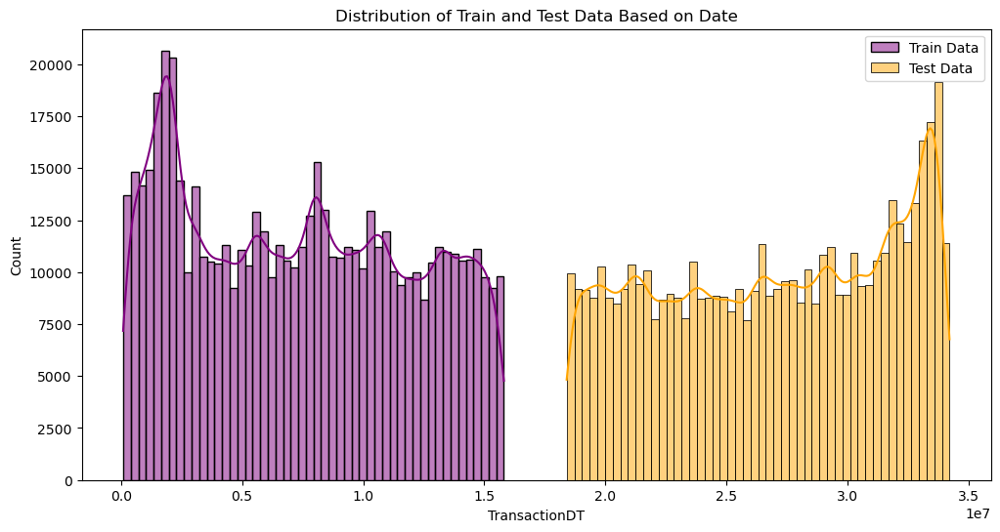

In [38]:
# Set the figure size
plt.figure(figsize=(12, 6))

# Plot the distribution of train data with a different color
sns.histplot(train_transaction_data['TransactionDT'], bins=50, label='Train Data', kde=True, color='purple')

# Plot the distribution of test data with a different color
sns.histplot(test_transaction_data['TransactionDT'], bins=50, label='Test Data', kde=True, color='orange')

# Set labels and title
plt.xlabel('TransactionDT')
plt.ylabel('Count')
plt.title('Distribution of Train and Test Data Based on Date')

# Add a legend
plt.legend()

# Show the plot
plt.show()

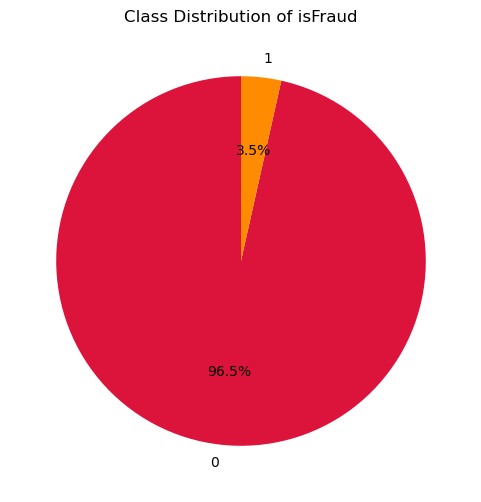

In [39]:
# Assuming 'train_transaction_data' is the DataFrame and 'isFraud' is the column representing the class labels
class_distribution = train_transaction_data['isFraud'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(6, 6))
plt.pie(class_distribution, labels=class_distribution.index, autopct='%1.1f%%', startangle=90, colors=['crimson', 'darkorange'])
plt.title('Class Distribution of isFraud')
plt.show()

In [40]:
# Assuming train_transaction_data is your DataFrame
cat_features_train_trans = train_transaction_data.select_dtypes(include=['object']).columns
num_features_train_trans = train_transaction_data.select_dtypes(exclude=['object']).columns

print("Categorical Features:")
print(cat_features_train_trans)

print("\nNumerical Features:")
print(num_features_train_trans)

Categorical Features:
Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9'],
      dtype='object')

Numerical Features:
Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'card1',
       'card2', 'card3', 'card5', 'addr1', 'addr2',
       ...
       'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338',
       'V339'],
      dtype='object', length=380)


In [41]:
# Iterate through categorical features and print unique values
for feature in cat_features_train_trans:
    unique_values = train_transaction_data[feature].unique()
    print(f"Unique values in {feature}: {unique_values}")

Unique values in ProductCD: ['W' 'H' 'C' 'S' 'R']
Unique values in card4: ['discover' 'mastercard' 'visa' 'american express' nan]
Unique values in card6: ['credit' 'debit' nan 'debit or credit' 'charge card']
Unique values in P_emaildomain: [nan 'gmail.com' 'outlook.com' 'yahoo.com' 'mail.com' 'anonymous.com'
 'hotmail.com' 'verizon.net' 'aol.com' 'me.com' 'comcast.net'
 'optonline.net' 'cox.net' 'charter.net' 'rocketmail.com' 'prodigy.net.mx'
 'embarqmail.com' 'icloud.com' 'live.com.mx' 'gmail' 'live.com' 'att.net'
 'juno.com' 'ymail.com' 'sbcglobal.net' 'bellsouth.net' 'msn.com' 'q.com'
 'yahoo.com.mx' 'centurylink.net' 'servicios-ta.com' 'earthlink.net'
 'hotmail.es' 'cfl.rr.com' 'roadrunner.com' 'netzero.net' 'gmx.de'
 'suddenlink.net' 'frontiernet.net' 'windstream.net' 'frontier.com'
 'outlook.es' 'mac.com' 'netzero.com' 'aim.com' 'web.de' 'twc.com'
 'cableone.net' 'yahoo.fr' 'yahoo.de' 'yahoo.es' 'sc.rr.com' 'ptd.net'
 'live.fr' 'yahoo.co.uk' 'hotmail.fr' 'hotmail.de' 'hotmail.co

In [42]:
# Mapping dictionary for email domain to brand
email_to_brand_mapping = {
    'gmail.com': 'Gmail',
    'outlook.com': 'Outlook',
    'yahoo.com': 'Yahoo Mail',
    'mail.com': 'Mail.com',
    'anonymous.com': 'Other',
    'hotmail.com': 'Outlook',
    'verizon.net': 'Verizon',
    'aol.com': 'AOL',
    'me.com': 'Apple iCloud',
    'comcast.net': 'Comcast',
    'optonline.net': 'Optonline',
    'cox.net': 'Cox',
    'charter.net': 'Charter',
    'rocketmail.com': 'Yahoo Mail',
    'prodigy.net.mx': 'Prodigy',
    'embarqmail.com': 'EarthLink',
    'icloud.com': 'Apple iCloud',
    'live.com.mx': 'Outlook',
    'gmail': 'Gmail',
    'live.com': 'Outlook',
    'att.net': 'AT&T',
    'juno.com': 'Juno',
    'ymail.com': 'Yahoo Mail',
    'sbcglobal.net': 'SBCGlobal',
    'bellsouth.net': 'BellSouth',
    'msn.com': 'MSN',
    'q.com': 'Q',
    'yahoo.com.mx': 'Yahoo Mail',
    'centurylink.net': 'CenturyLink',
    'servicios-ta.com': 'Servicios TA',
    'earthlink.net': 'EarthLink',
    'hotmail.es': 'Outlook',
    'cfl.rr.com': 'CFL',
    'roadrunner.com': 'Roadrunner',
    'netzero.net': 'NetZero',
    'gmx.de': 'GMX',
    'suddenlink.net': 'Suddenlink',
    'frontiernet.net': 'Frontier',
    'windstream.net': 'Windstream',
    'frontier.com': 'Frontier',
    'outlook.es': 'Outlook',
    'mac.com': 'Apple iCloud',
    'netzero.com': 'NetZero',
    'aim.com': 'AOL',
    'web.de': 'Web.de',
    'twc.com': 'TWC',
    'cableone.net': 'CableOne',
    'yahoo.fr': 'Yahoo Mail',
    'yahoo.de': 'Yahoo Mail',
    'yahoo.es': 'Yahoo Mail',
    'sc.rr.com': 'SC',
    'ptd.net': 'PTD',
    'live.fr': 'Outlook',
    'yahoo.co.uk': 'Yahoo Mail',
    'hotmail.fr': 'Outlook',
    'hotmail.de': 'Outlook',
    'hotmail.co.uk': 'Outlook',
    'protonmail.com': 'ProtonMail',
    'yahoo.co.jp': 'Yahoo Mail'
}

# Create a new column P_emaildomain_mapped based on the mapping
train_transaction_data['P_emaildomain_mapped'] = train_transaction_data['P_emaildomain'].map(email_to_brand_mapping)

# Create a new column R_emaildomain_mapped based on the mapping
train_transaction_data['R_emaildomain_mapped'] = train_transaction_data['R_emaildomain'].map(email_to_brand_mapping)

In [43]:
# Drop the 'P_emaildomain' and 'R_emaildomain' columns
train_transaction_data.drop(['P_emaildomain', 'R_emaildomain'], axis=1, inplace=True)

In [44]:
# Create a new column P_emaildomain_mapped based on the mapping
test_transaction_data['P_emaildomain_mapped'] = test_transaction_data['P_emaildomain'].map(email_to_brand_mapping)

# Create a new column R_emaildomain_mapped based on the mapping
test_transaction_data['R_emaildomain_mapped'] = test_transaction_data['R_emaildomain'].map(email_to_brand_mapping)

In [45]:
# Drop the 'P_emaildomain' and 'R_emaildomain' columns
test_transaction_data.drop(['P_emaildomain', 'R_emaildomain'], axis=1, inplace=True)

In [46]:
# Assuming train_transaction_data is your DataFrame
cat_features_train_trans = train_transaction_data.select_dtypes(include=['object']).columns
num_features_train_trans = train_transaction_data.select_dtypes(exclude=['object']).columns

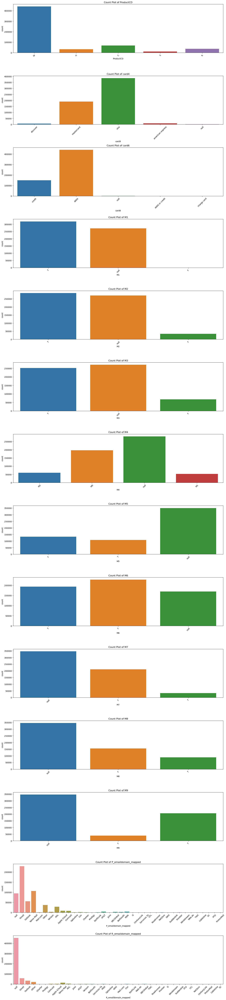

In [47]:
# Create count plots for categorical features including null values
plt.figure(figsize=(16, 5 * len(cat_features_train_trans)))

for i, feature in enumerate(cat_features_train_trans, 1):
    plt.subplot(len(cat_features_train_trans), 1, i)
    
    # Replace null values with "null" category
    train_transaction_data[feature].fillna("null", inplace=True)
    
    sns.countplot(data=train_transaction_data, x=feature)
    plt.title(f"Count Plot of {feature}")
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

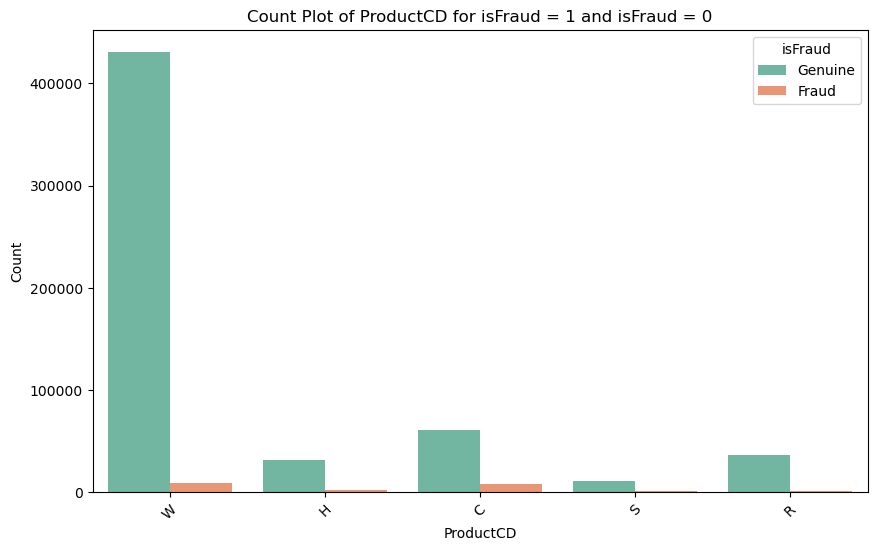

In [48]:
# Create a count plot for ProductCD with both isFraud = 1 and isFraud = 0
plt.figure(figsize=(10, 6))
sns.countplot(data=train_transaction_data, x='ProductCD', hue='isFraud', palette='Set2')
plt.title("Count Plot of ProductCD for isFraud = 1 and isFraud = 0")
plt.xlabel("ProductCD")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.legend(title='isFraud', labels=['Genuine', 'Fraud'])
plt.show()

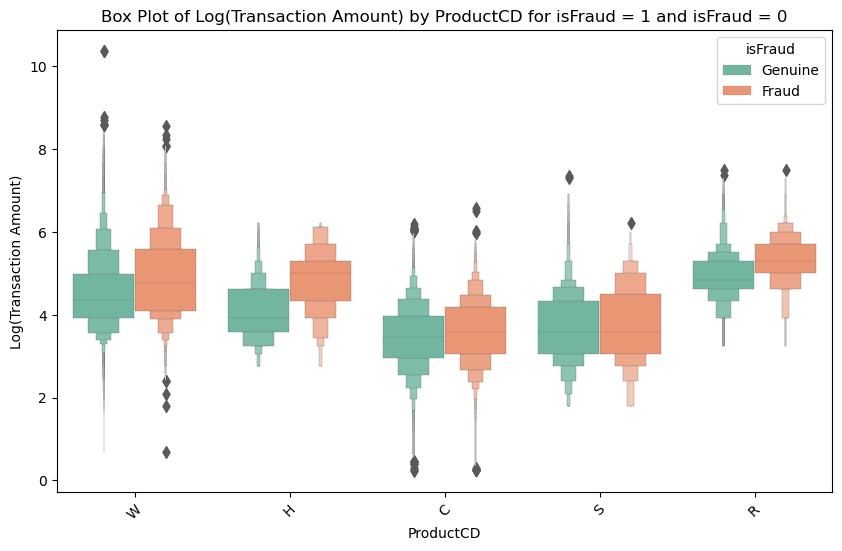

In [49]:
# Convert TransactionAmt to its logarithmic value
train_transaction_data['TransactionAmt_log'] = np.log1p(train_transaction_data['TransactionAmt'])

# Define the order of categories in the 'isFraud' column
fraud_categories = [0, 1]  # Assuming 0 is for 'Genuine' and 1 is for 'Fraud'

# Create a boxen plot for ProductCD with isFraud = 1 and isFraud = 0 using the log-transformed values
plt.figure(figsize=(10, 6))
sns.boxenplot(data=train_transaction_data, x='ProductCD', y='TransactionAmt_log', 
               hue='isFraud', palette='Set2', linewidth=0.2, hue_order=fraud_categories)
plt.title("Box Plot of Log(Transaction Amount) by ProductCD for isFraud = 1 and isFraud = 0")
plt.xlabel("ProductCD")
plt.ylabel("Log(Transaction Amount)")
plt.xticks(rotation=45)

# Define the legend with the correct labels
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['Genuine', 'Fraud']
plt.legend(handles=handles, labels=labels, title='isFraud')

plt.show()


The ammount of transaction. I've taken a log transform in some of these plots to better show the distribution- otherwise the few, very large transactions skew the distribution. Because of the log transfrom, any values between 0 and 1 will appear to be negative.

The provided image displays box plots that offer a visual comparison between log-transformed transaction amounts for genuine and fraudulent transactions across several product codes, labeled as W, H, C, S, and R. A critical and comparative analysis of these plots reveals several noteworthy patterns and differences:

##### Central Tendency and Variability:
The median, indicated by the line within each box, is a measure of central tendency. For product codes W and H, the median of the fraudulent transactions is visibly higher than that of the genuine ones, suggesting that fraud for these products involves higher transaction amounts when viewed on a logarithmic scale. Conversely, for product codes C, S, and R, the medians of genuine and fraudulent transactions are more closely aligned, implying less distinction in the transaction amounts between the two groups. The spread of the data, represented by the box height, varies across product codes. A larger box implies greater variability in the data. For product code W, fraudulent transactions show a wider interquartile range (IQR) compared to genuine transactions, indicating a higher variability in the amount of fraudulent transactions.

##### Outliers:
The presence of outliers, shown as individual points beyond the whiskers, is prominent in both categories across all product codes. Notably, for product codes W and H, fraudulent transactions exhibit a higher number of outliers with larger values, which could indicate occasional but significantly large fraudulent transaction amounts.

##### Comparative Distribution Insights:
Comparing across product codes, the distribution of transaction amounts for both genuine and fraudulent transactions varies, suggesting different patterns of transaction behavior for each product code. For instance, the box plots for product code S are relatively tighter and more symmetrical, indicating less variability and skew in the transaction amounts for both genuine and fraudulent transactions. This could suggest a more consistent pattern of spending or fraud in this category.

##### Skewness and Data Behavior:
The asymmetry of the box plots indicates skewness in the data. Where the whiskers extend further on one side of the box, it suggests a tail in the distribution. For product codes W and H, there is a noticeable skew in fraudulent transactions, with a longer upper whisker indicating a right skew. This pattern suggests that while the majority of fraudulent transactions may not be exceedingly high, there are enough high-value transactions to skew the distribution.

##### Implications for Fraud Detection:
The visual differences in the distributions between genuine and fraudulent transactions can be of significant interest for developing fraud detection algorithms. The patterns observed—for example, the higher medians and greater variability in fraudulent transactions for certain product codes—can serve as indicators for potential fraudulent activity. Predictive models could be trained to recognize such patterns and flag transactions that fall outside the expected range for further investigation.

In summary, the box plots provide a detailed visualization of the transaction amounts across different product codes, highlighting potential disparities in behavior between genuine and fraudulent transactions. These disparities, particularly in terms of central tendency, variability, and outliers, are critical for understanding and detecting fraudulent activities. The analysis suggests that product codes W and H, in particular, may be more prone to higher and more variable fraudulent transaction amounts, whereas product codes C, S, and R exhibit a closer alignment between genuine and fraudulent transactions.

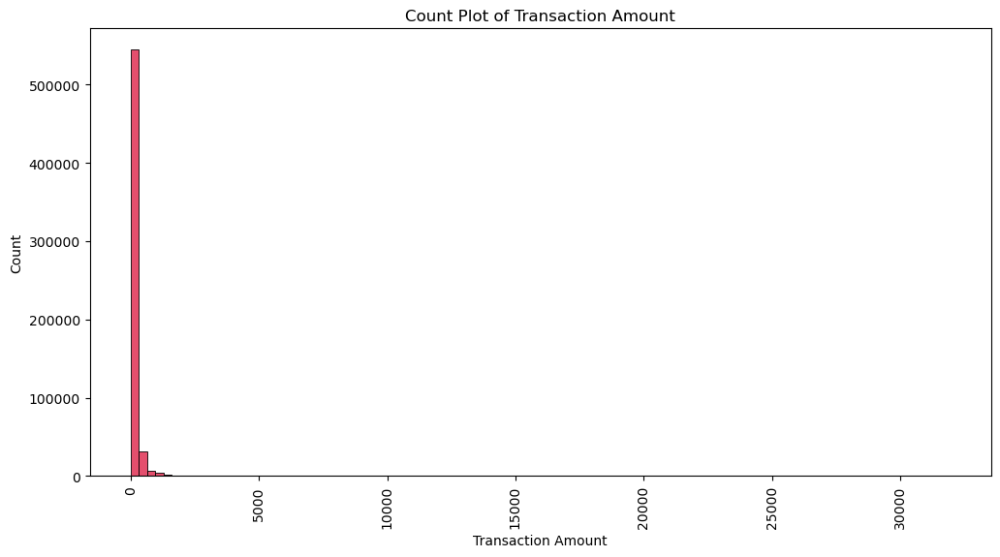

In [50]:
# Create a count plot for TransactionAmt
plt.figure(figsize=(12, 6))
sns.histplot(data=train_transaction_data, x='TransactionAmt', bins=100, color='crimson')
plt.title("Count Plot of Transaction Amount")
plt.xlabel("Transaction Amount")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

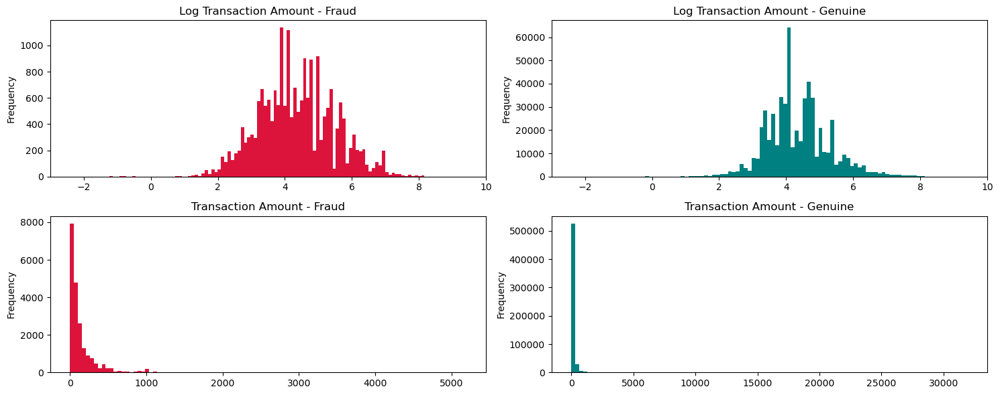

In [51]:
def plot_histogram(data, condition, log_transform, ax, title, color):
    if log_transform:
        data_to_plot = data.loc[data['isFraud'] == condition, 'TransactionAmt'].apply(np.log)
    else:
        data_to_plot = data.loc[data['isFraud'] == condition, 'TransactionAmt']
    
    data_to_plot.plot(kind='hist', bins=100, title=title, xlim=(-3, 10) if log_transform else None, color=color, ax=ax)

fig, axes = plt.subplots(2, 2, figsize=(15, 6))
plot_conditions = [(1, True, 'crimson'), (0, True, 'teal'), (1, False, 'crimson'), (0, False, 'teal')]
titles = ['Log Transaction Amount - Fraud', 'Log Transaction Amount - Genuine', 
          'Transaction Amount - Fraud', 'Transaction Amount - Genuine']

for ax, (condition, log_transform, color), title in zip(axes.flatten(), plot_conditions, titles):
    plot_histogram(train_transaction_data, condition, log_transform, ax, title, color)

plt.tight_layout()
plt.show()

The histograms provided in the image show the distribution of transaction amounts for both fraudulent and non-fraudulent transactions, both in their original scale and after a logarithmic transformation. Here's a critical analysis of these outputs:

#### Original Scale Histograms (Bottom Histograms):

##### Fraudulent Transactions (Bottom-Left): 
The distribution of fraudulent transaction amounts is highly right-skewed, which suggests that there are more instances of smaller transaction amounts than larger ones. This could indicate that fraudsters often opt for smaller transaction amounts, possibly to avoid detection. The tail of the distribution extends quite far to the right, indicating that while rare, there are still significant instances of high-value fraud.

##### Non-Fraudulent Transactions (Bottom-Right): 
Non-fraudulent transactions also show a right-skewed distribution but with a less pronounced tail, implying that very high transaction amounts are less common in genuine transactions compared to fraud. This distribution also indicates that most legitimate transactions involve smaller amounts of money.

#### Logarithmic Scale Histograms (Top Histograms):

##### Fraudulent Transactions (Top-Left): 
When the transaction amounts are log-transformed, the distribution of fraudulent transactions reveals multiple peaks (multimodal distribution). This suggests that there are specific transaction amount ranges that are more commonly associated with fraud. The multimodal nature could indicate that different types of fraudulent activities may have preferred transaction amounts.

##### Non-Fraudulent Transactions (Top-Right): 
The log-transformed data for non-fraudulent transactions also shows a multimodal distribution but with a more pronounced central peak. This centralization indicates that there is a more typical transaction amount range for legitimate transactions. The presence of multiple peaks, however, suggests that even within non-fraudulent transactions, there are clusters of common amounts, potentially corresponding to common purchasing patterns or subscription fees.

#### Comparative Analysis:

1. The logarithmic transformation provides a clearer picture of the distribution of transaction amounts by reducing the skewness and revealing the underlying patterns in the data.
2. The presence of multimodal peaks in both fraudulent and non-fraudulent transactions on the log scale could be indicative of different groups or types of transactions within each category.
3. The broader range of amounts in the fraudulent transactions could imply a wider variety of fraud types, each with its preferred amount, compared to the more concentrated range in the non-fraudulent transactions.
4. The skewness in both distributions suggests that regardless of fraud, most transactions involve smaller amounts of money, but the long tail in the fraudulent distribution indicates occasional attempts at high-value frauds.

#### Implications for Fraud Detection:

1. Detection systems may benefit from focusing on the ranges of transaction amounts where the frequency of fraud is higher, as suggested by the peaks in the log-transformed data.
2. Since fraud is less common at very high transaction amounts, setting higher scrutiny levels for smaller transaction amounts might improve detection rates.
3. The distinct patterns in the distribution of log-transformed fraudulent transactions suggest that machine learning models could potentially identify these patterns to predict fraudulent activity.

In [52]:
fraud_mean_transaction_amt = train_transaction_data.loc[train_transaction_data['isFraud'] == 1]['TransactionAmt'].mean()
non_fraud_mean_transaction_amt = train_transaction_data.loc[train_transaction_data['isFraud'] == 0]['TransactionAmt'].mean()

print('Average transaction amount for fraudulent transactions: {:.2f}'.format(fraud_mean_transaction_amt))
print('Average transaction amount for genuine transactions: {:.2f}'.format(non_fraud_mean_transaction_amt))


Average transaction amount for fraudulent transactions: 149.24
Average transaction amount for genuine transactions: 134.51


## ProductCD

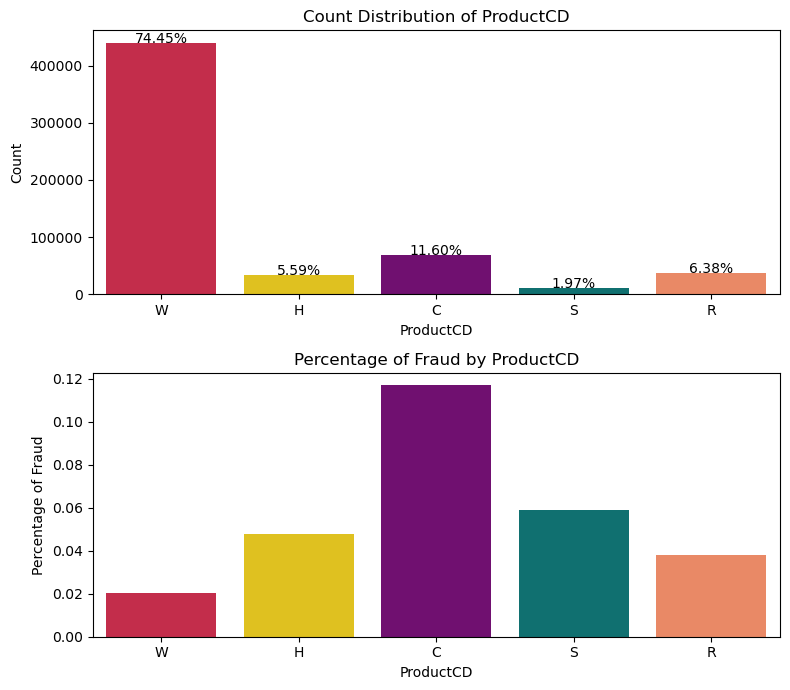

In [53]:
# Define a custom color palette
custom_palette = ['crimson', 'gold', 'purple', 'teal', 'coral']

# Create a 2x1 subplot
fig, axes = plt.subplots(2, 1, figsize=(8, 7))

# Plot the count distribution of 'ProductCD' in the first subplot
sns.countplot(data=train_transaction_data, x='ProductCD', palette=custom_palette, ax=axes[0])
axes[0].set_title('Count Distribution of ProductCD')
axes[0].set_xlabel('ProductCD')
axes[0].set_ylabel('Count')

# Add percentage labels on top of each bar in the first subplot
total_count = len(train_transaction_data)
for p in axes[0].patches:
    percentage = f'{100 * p.get_height() / total_count:.2f}%'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    axes[0].annotate(percentage, (x, y), ha='center')

# Plot the percentage of fraud by 'ProductCD' in the second subplot
sns.barplot(data=train_transaction_data, x='ProductCD', y='isFraud', ci=None, palette=custom_palette, ax=axes[1])
axes[1].set_title('Percentage of Fraud by ProductCD')
axes[1].set_xlabel('ProductCD')
axes[1].set_ylabel('Percentage of Fraud')

plt.tight_layout()
plt.show()

##### From the top graph (Count Distribution of ProductCD):
1. Product W has the highest count, making up 74.45% of the total transactions, which is a dominant majority.
2. Products H, C, S, and R have significantly lower counts, with H making up 5.59%, C at 11.60%, S at 1.97%, and R at 6.38% of total transactions.

##### From the bottom graph (Percentage of Fraud by ProductCD):
1. Product C, despite having a smaller share of the total transactions (11.60%), has the highest percentage of fraud.
2. Product W, while being the most common product, has one of the lower percentages of fraud.
3. Product S has a relatively low number of transactions but has a higher percentage of fraud than W and R but lower than C.
4. Products H and R have moderate to low percentages of fraud compared to their transaction counts.

##### Critical Analysis:
1. The disproportionate percentage of fraud in Product C transactions is alarming. Even though Product C accounts for only 11.60% of the total transactions, it has the highest percentage of fraud. This suggests a higher risk associated with Product C transactions, which could point towards inherent vulnerabilities in the transaction process, less stringent security measures, or it could be an attractive target for fraudulent activities.
2. Product W’s low fraud percentage despite its high volume of transactions could indicate effective fraud prevention measures, or it could be less targeted by fraudsters due to the nature of the product or transaction size.
3. The relatively high fraud percentage for Product S with its low transaction count may suggest either a targeted abuse or inherent risk similar to Product C.
4. Products H and R seem to be less prone to fraud based on their fraud percentages, which may be due to more robust security measures, less appeal to fraudsters, or the nature of the transactions being less vulnerable to fraud.

##### Comparisons and Conclusions:
1. There is a clear inverse relationship between the volume of transactions and the percentage of fraud in Products W and C. High-volume transactions (Product W) have a low fraud percentage, whereas low-volume transactions (Product C) have a high fraud percentage.
2. The data suggests that focusing on enhancing the security of transactions for Products C and S could be beneficial due to their higher fraud percentages.
3. The large discrepancy between transaction count and fraud percentage for different products may also suggest that one-size-fits-all fraud prevention strategies might not be effective. Tailored approaches for different products could be more effective in mitigating fraud risk.
4. It is important to consider that fraud percentages alone do not provide insight into the absolute number of fraud cases. For instance, even a low fraud percentage in Product W could represent a significant number of fraudulent transactions due to its high volume.

Overall, this analysis suggests that while Product W transactions are prevalent, they are not the most at-risk for fraud. Product C, despite fewer transactions, shows a vulnerability to fraudulent activities, warranting a closer investigation into the reasons behind this trend and the implementation of targeted fraud prevention strategies.

## card1 - card6

In [54]:
# Creating a variable with all the card details
card_cols = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6']

In [55]:
train_transaction_data[card_cols].head(10)

,card1,card2,card3,card4,card5,card6
0,13926,NaN,150.0,discover,142.0,credit
1,2755,404.0,150.0,mastercard,102.0,credit
2,4663,490.0,150.0,visa,166.0,debit
3,18132,567.0,150.0,mastercard,117.0,debit
4,4497,514.0,150.0,mastercard,102.0,credit
5,5937,555.0,150.0,visa,226.0,debit
6,12308,360.0,150.0,visa,166.0,debit
7,12695,490.0,150.0,visa,226.0,debit
8,2803,100.0,150.0,visa,226.0,debit
9,17399,111.0,150.0,mastercard,224.0,debit


In [56]:
train_transaction_data[card_cols].dtypes

card1      int64
card2    float64
card3    float64
card4     object
card5    float64
card6     object
dtype: object

In [57]:
train_transaction_data[card_cols].shape

(590540, 6)

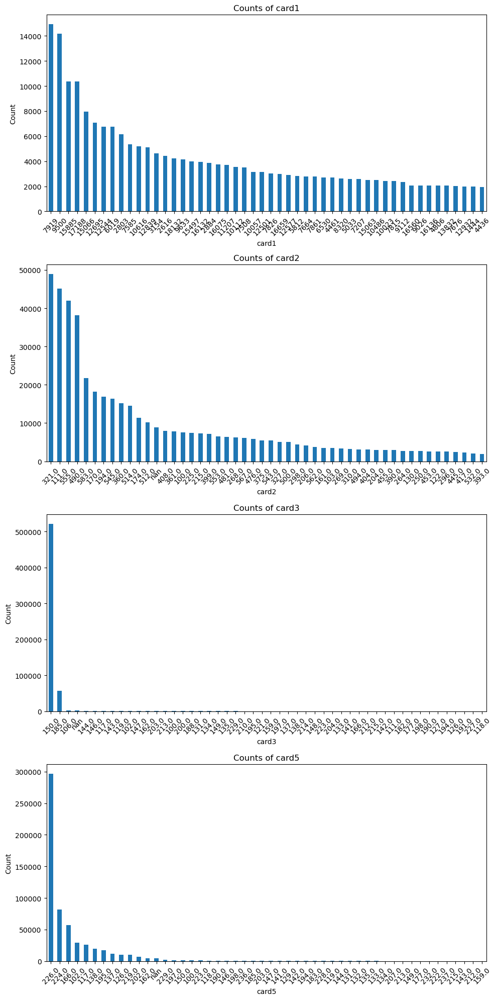

In [58]:
# Create a list of numerical features
card_num_features = train_transaction_data[card_cols].select_dtypes(exclude=['object']).columns

# Create subplots
fig, axs = plt.subplots(len(card_num_features), 1, figsize=(10, 5 * len(card_num_features)))

# Iterate through each feature and create a count plot for the top 50 unique values
top_n = 50  # Number of top unique values to show
for i, feature in enumerate(card_num_features):
    ax = axs[i]
    
    # Get the value counts for the feature
    feature_count = train_transaction_data[feature].value_counts(dropna=False)
    
    # Select the top N unique values (top 50 in this case)
    feature_count = feature_count.head(top_n)
    
    # Plot the count distribution
    feature_count.plot(kind='bar', ax=ax)
    
    ax.set_title(f"Counts of {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

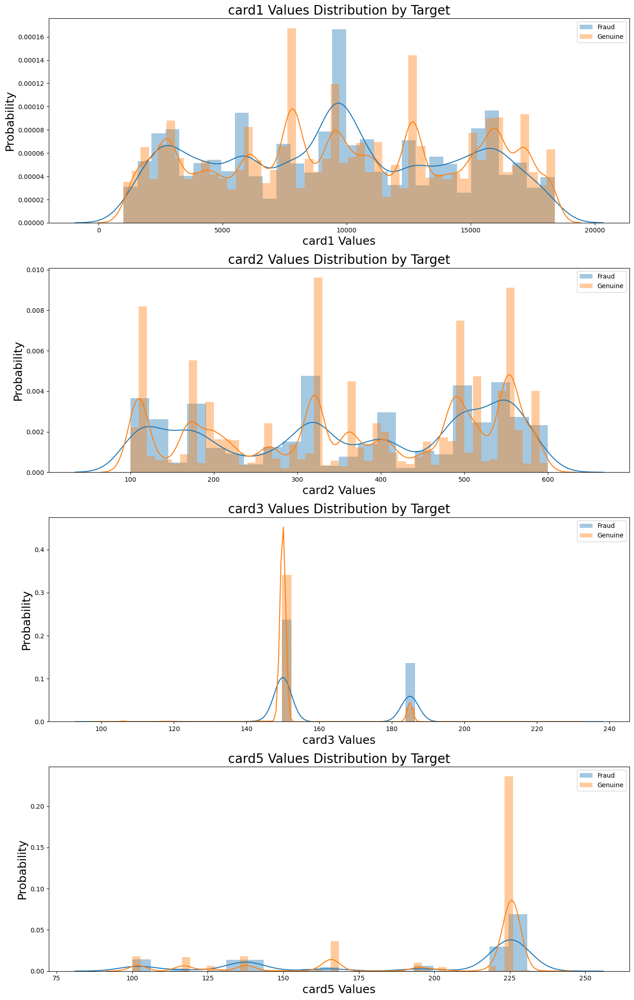

In [59]:
plt.figure(figsize=(14, 22))

for i, col in enumerate(card_num_features, start=1):
    plt.subplot(4, 1, i)
    sns.distplot(train_transaction_data[train_transaction_data['isFraud'] == 1][col], label='Fraud')
    sns.distplot(train_transaction_data[train_transaction_data['isFraud'] == 0][col], label='Genuine')
    plt.legend()
    plt.title(f"{col} Values Distribution by Target", fontsize=20)
    plt.xlabel(f"{col} Values", fontsize=18)
    plt.ylabel("Probability", fontsize=18)

plt.tight_layout()  # Add this line to prevent overlapping
plt.show()

Here’s a critical analysis based on what is visible in the graph:

##### card1 Values Distribution by Target:
1. There is a wide range of card1 values, spread across a large scale (0 to 20000).
2. The distribution for both Genuine and Fraud transactions seems to be quite spread out, with multiple peaks indicating that there might not be a strong differentiation in the card1 values between the two categories.
3. The KDE lines suggest that the distribution of card1 values for both Fraud and Genuine is multimodal.

##### card2 Values Distribution by Target:
1. card2 values are on a smaller scale (0 to 600) compared to card1.
2. The Genuine category seems to have a more uniform distribution, while the Fraud category has several pronounced peaks, suggesting specific card2 values are more commonly associated with fraudulent transactions.
3. The KDE for Fraud shows clear spikes, suggesting that certain values of card2 are indicative of fraudulent activity.

##### card3 Values Distribution by Target:
1. card3 values are concentrated around 150, with a sharp peak for Genuine transactions.
2. There is a significant peak for Fraud as well, but it is much narrower and higher, suggesting that when card3 takes a specific value, it is highly indicative of fraud.
3. The KDE for both categories shows a sharp peak, but the Fraud peak is more pronounced.

##### card5 Values Distribution by Target:
1. The scale of card5 values is between 75 and 250, similar to card2.
2. There are a few peaks in the distribution of the Fraud category, similar to card2, which could be specific indicators of fraudulent transactions.
3. The Genuine transactions for card5 seem to have a more uniform distribution with a slight peak around 200.

#### Comparisons and Conclusions:

1. The scale of values varies greatly between the different card variables, which could be indicative of the type of data each variable represents.
2. The presence of sharp peaks in the Fraud distributions of card2, card3, and card5 suggests that there are specific values that are more commonly associated with fraudulent transactions. This could be useful for developing predictive models or for flagging potentially fraudulent activity.
3. The distributions for Genuine transactions tend to be more uniform or multimodal, which might indicate that legitimate transactions are more varied in their nature and do not cluster around specific values as much as fraudulent transactions do.
4. It is important to note that while the graphs do provide some visual insights, statistical tests would be necessary to determine if the observed differences in distributions are statistically significant.
5. Additionally, it would be beneficial to look at these variables in conjunction with other features to better understand their predictive power and the relationships between them.

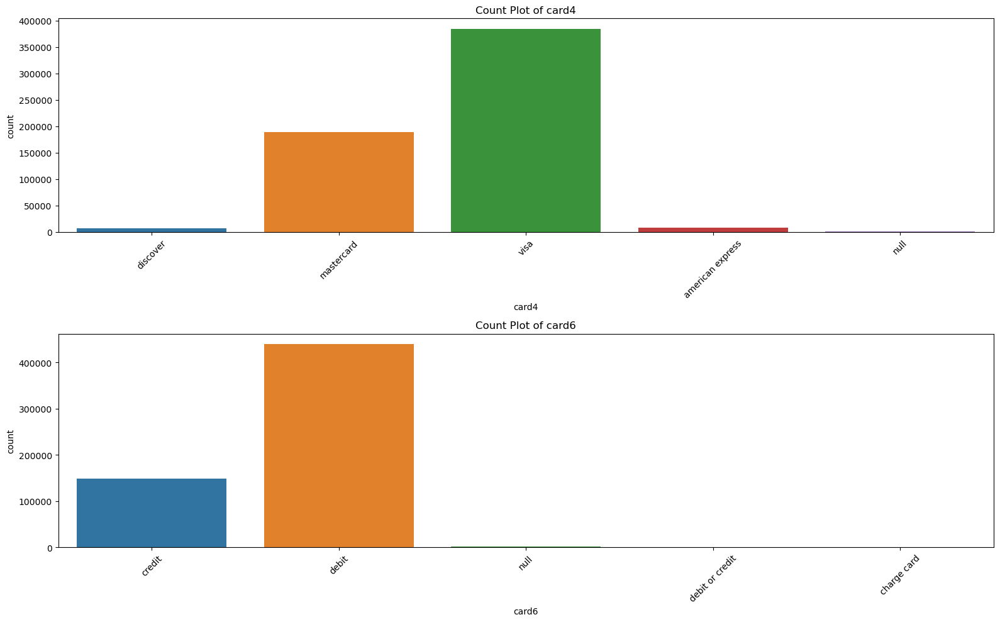

In [60]:
# Create a list of categorical features
card_cat_features = train_transaction_data[card_cols].select_dtypes(include=['object']).columns

# Create count plots for categorical features including null values
plt.figure(figsize=(16, 5 * len(card_cat_features)))

for i, feature in enumerate(card_cat_features, 1):
    plt.subplot(len(card_cat_features), 1, i)

    sns.countplot(data=train_transaction_data[card_cols], x=feature)
    plt.title(f"Count Plot of {feature}")
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

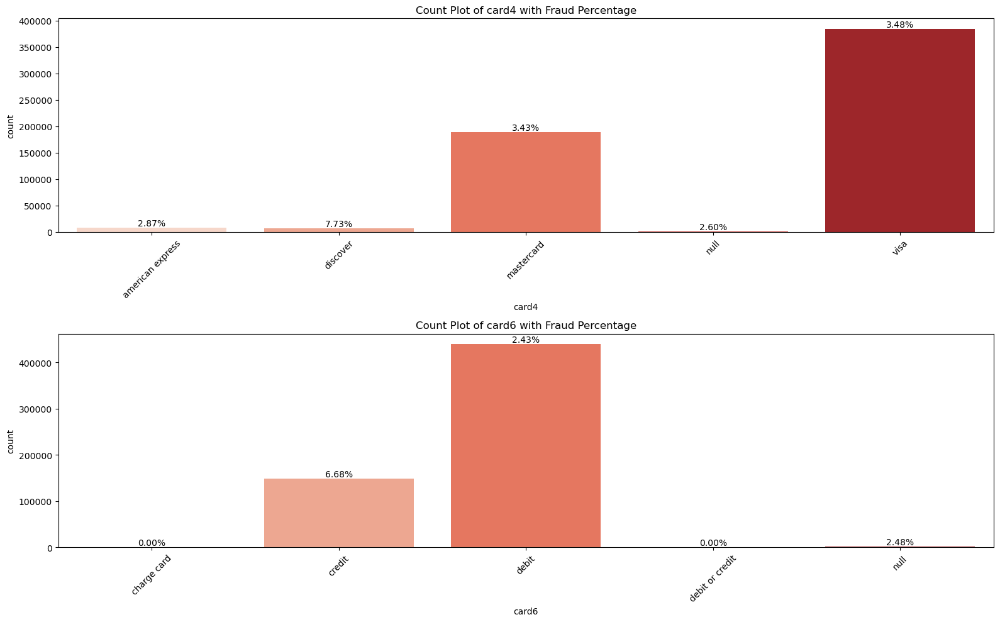

In [61]:
# Assuming 'isFraud' is the column indicating whether the transaction is fraudulent
fraud_column = 'isFraud'

# Create a figure
plt.figure(figsize=(16, 5 * len(card_cat_features)))

# Loop through each categorical feature
for i, feature in enumerate(card_cat_features, 1):
    # Create a subplot for each feature
    plt.subplot(len(card_cat_features), 1, i)

    # Group by the feature and calculate the total count and fraud count
    grouped_data = train_transaction_data.groupby(feature)
    total_count = grouped_data.size()
    fraud_count = grouped_data[fraud_column].sum()

    # Calculate the percentage of fraud
    fraud_percentage = (fraud_count / total_count) * 100

    # Create a count plot with the 'viridis' color palette
    sns.countplot(data=train_transaction_data, x=feature, order=total_count.index, palette='Reds')

    # Add the percentage of fraud on top of each bar
    for index, value in enumerate(total_count):
        plt.text(index, value, f'{fraud_percentage.iloc[index]:.2f}%', ha="center", va="bottom")

    # Set the title of the subplot
    plt.title(f"Count Plot of {feature} with Fraud Percentage")
    plt.xticks(rotation=45)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

### Incorrect explanation, needs fixing...

In the "card4" graph, the Visa category is predominantly filled with red, which represents fraudulent transactions. This suggests that for Visa, the number of fraudulent transactions far exceeds the number of genuine transactions, contrary to the typical expectation. Mastercard displays a balance between genuine and fraudulent transactions, with genuine ones largely outnumbering the fraudulent. Discover stands out with a very high number of genuine transactions and a relatively minuscule amount of fraud. American Express shows fewer transactions overall, but like Mastercard, it has a greater proportion of genuine transactions to fraud. The 'null' category has a negligible overall count, making any analysis of fraud versus genuine transactions less significant.

The "card6" graph displays a different aspect of transaction data, categorized by the nature of the card (credit or debit). Here, debit cards demonstrate a vast majority of genuine transactions with a small proportion of fraud. In contrast, credit cards, while having fewer transactions overall, show a greater proportion of fraud compared to genuine transactions. The 'null' category is again negligible in this graph.

These graphs collectively suggest that Visa card transactions experience an alarmingly high rate of fraud compared to the other card types. Meanwhile, debit transactions are predominantly genuine, indicating a lower risk of fraud in comparison to credit transactions. This data might prompt card issuers, merchants, and consumers to be particularly vigilant with Visa transactions and possibly re-evaluate their fraud detection and prevention measures for this card type. It also underscores a potential area of concern for credit card transactions, which appear more susceptible to fraud than their debit counterparts.

In [62]:
# Create subplots for each categorical feature
#plt.figure(figsize=(16, 5 * len(card_cat_features)))

#for i, feature in enumerate(card_cat_features, 1):
#    plt.subplot(len(card_cat_features), 1, i)
#
    # Adjust vertical spacing between subplots
#    plt.subplots_adjust(hspace=0.5)
    
    # Create a countplot for non-fraud transactions
#    sns.countplot(data=train_transaction_data[train_transaction_data['isFraud'] == 0], x=feature, color='gold', label='Genuine')

    # Overlay with a countplot for fraud transactions
#    sns.countplot(data=train_transaction_data[train_transaction_data['isFraud'] == 1], x=feature, color='crimson', label='Fraud')

#    plt.title(f"Count of Fraud and Genuine Transactions of {feature}")
#    plt.xticks(rotation=45)
#    plt.legend()  # Display the legend to distinguish between Genuine and Fraud
    
#plt.show()

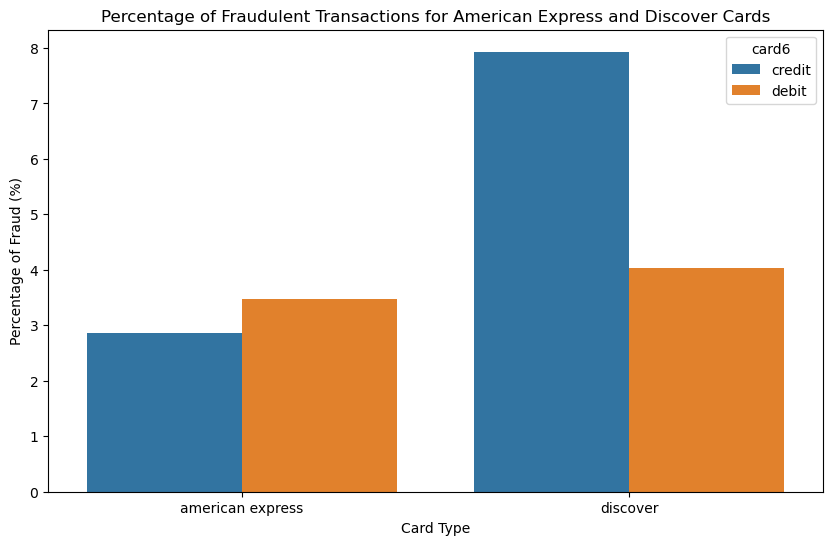

In [63]:
# Filter for American Express and Discover transactions
filtered_transactions = train_transaction_data[train_transaction_data['card4'].isin(['american express', 'discover'])]

# Filter for credit and debit transactions
filtered_transactions = filtered_transactions[filtered_transactions['card6'].isin(['credit', 'debit'])]

# Group by card4 and card6, then calculate the percentage of fraud
grouped = filtered_transactions.groupby(['card4', 'card6'])
fraud_percentage = grouped[fraud_column].mean() * 100

# Reset index to use in seaborn barplot
fraud_percentage = fraud_percentage.reset_index()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='card4', y='isFraud', hue='card6', data=fraud_percentage)

plt.title('Percentage of Fraudulent Transactions for American Express and Discover Cards')
plt.ylabel('Percentage of Fraud (%)')
plt.xlabel('Card Type')
plt.show()

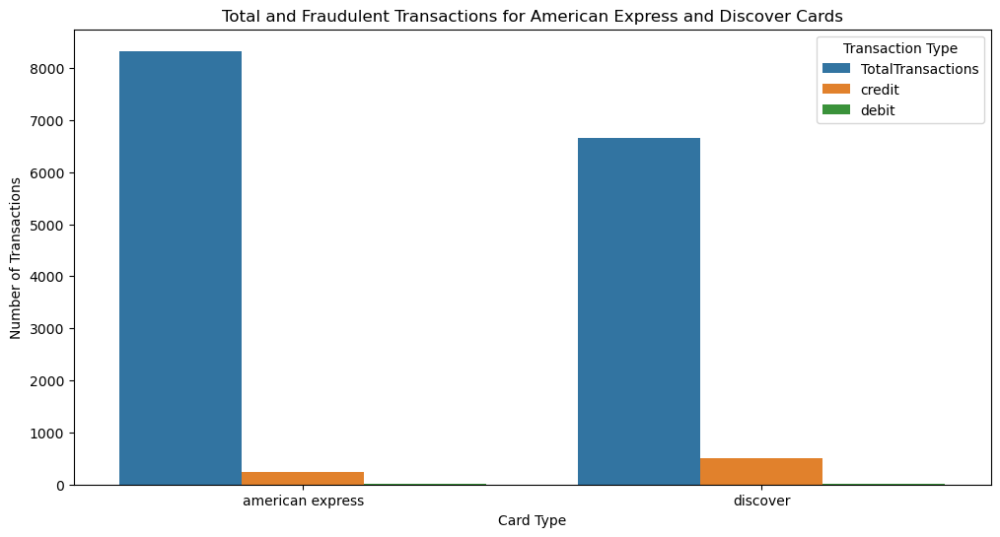

In [64]:
# Filter for American Express and Discover transactions
filtered_transactions = train_transaction_data[train_transaction_data['card4'].isin(['american express', 'discover'])]

# Count total transactions for American Express and Discover
total_counts = filtered_transactions['card4'].value_counts().reset_index()
total_counts.columns = ['card4', 'TotalTransactions']

# Count fraudulent transactions for credit and debit for American Express and Discover
fraud_counts = filtered_transactions[(filtered_transactions[fraud_column] == 1) & (filtered_transactions['card6'].isin(['credit', 'debit']))]
fraud_counts = fraud_counts.groupby(['card4', 'card6']).size().unstack(fill_value=0).reset_index()

# Merge total counts with fraud counts
final_data = pd.merge(total_counts, fraud_counts, on='card4')

# Melt the data for seaborn barplot
final_data_melted = final_data.melt(id_vars='card4', var_name='TransactionType', value_name='Count')

# Create a bar plot
plt.figure(figsize=(12, 6))
bar_plot = sns.barplot(x='card4', y='Count', hue='TransactionType', data=final_data_melted)

plt.title('Total and Fraudulent Transactions for American Express and Discover Cards')
plt.ylabel('Number of Transactions')
plt.xlabel('Card Type')
plt.legend(title='Transaction Type')

# Show plot
plt.show()

In [65]:
train_transaction_data[card_cols].isna().sum()

card1       0
card2    8933
card3    1565
card4       0
card5    4259
card6       0
dtype: int64

In [66]:
train_transaction_data[card_cols].isna().sum()/len(train_transaction_data[card_cols])*100

card1    0.000000
card2    1.512683
card3    0.265012
card4    0.000000
card5    0.721204
card6    0.000000
dtype: float64

A miniscule percentage of the data for card1 to card6 is null. Therefore, computing the missing values with the mean would be the most suitable option to achieve better results for training the model.

## Address

In [67]:
address = ['addr1', 'addr2']

In [68]:
train_transaction_data[address].head()

,addr1,addr2
0,315.0,87.0
1,325.0,87.0
2,330.0,87.0
3,476.0,87.0
4,420.0,87.0


In [69]:
train_transaction_data[address].dtypes

addr1    float64
addr2    float64
dtype: object

In [70]:
train_transaction_data[address].shape

(590540, 2)

In [71]:
train_transaction_data[address].isna().sum()

addr1    65706
addr2    65706
dtype: int64

In [72]:
train_transaction_data[address].isna().sum()/len(train_transaction_data)*100

addr1    11.126427
addr2    11.126427
dtype: float64

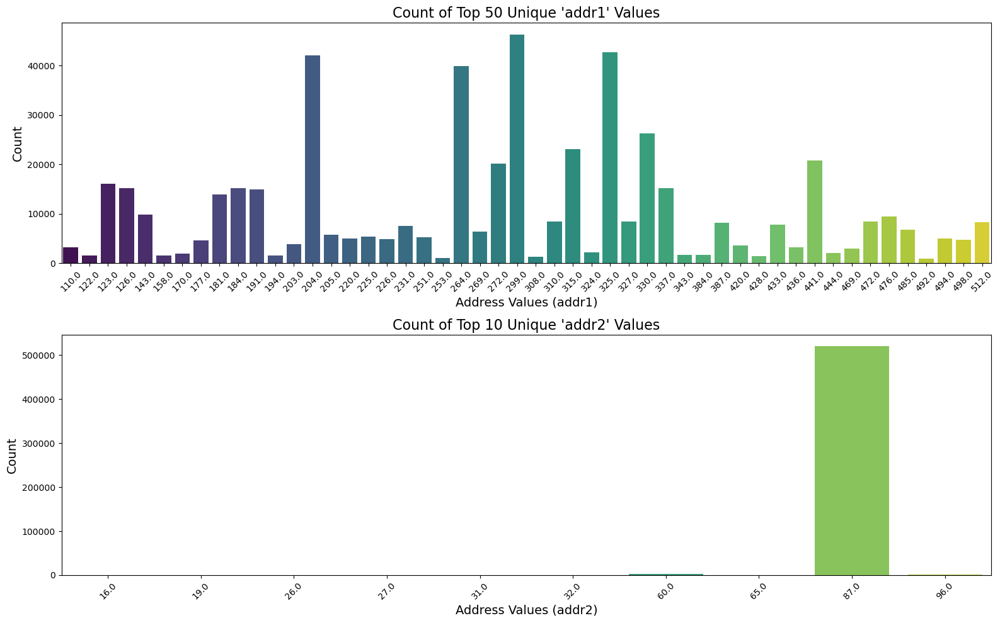

In [73]:
# Get the top 50 unique values in the 'addr1' column
top_50_addr1 = train_transaction_data['addr1'].value_counts().head(50)

# Get the top 50 unique values in the 'addr2' column
top_10_addr2 = train_transaction_data['addr2'].value_counts().head(10)

# Create subplots
plt.figure(figsize=(16, 10))

# Plot the count of top 50 unique 'addr1' values
plt.subplot(211)
sns.barplot(x=top_50_addr1.index, y=top_50_addr1.values, palette='viridis')
plt.title("Count of Top 50 Unique 'addr1' Values", fontsize=16)
plt.xlabel("Address Values (addr1)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)

# Plot the count of top 10 unique 'addr2' values
plt.subplot(212)
sns.barplot(x=top_10_addr2.index, y=top_10_addr2.values, palette='viridis')
plt.title("Count of Top 10 Unique 'addr2' Values", fontsize=16)
plt.xlabel("Address Values (addr2)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

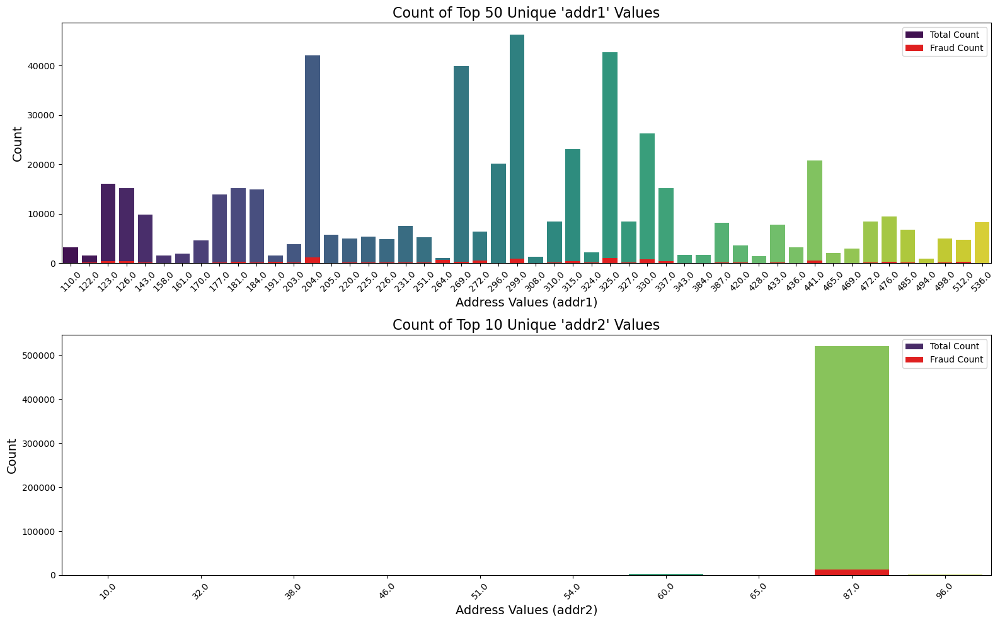

In [74]:
# Assuming you have a 'is_fraud' column in your transaction data indicating fraud cases
fraud_counts_addr1 = train_transaction_data[train_transaction_data['isFraud'] == 1]['addr1'].value_counts().head(50)
fraud_counts_addr2 = train_transaction_data[train_transaction_data['isFraud'] == 1]['addr2'].value_counts().head(10)

# Create subplots
plt.figure(figsize=(16, 10))

# Plot the count of top 50 unique 'addr1' values
plt.subplot(211)
sns.barplot(x=top_50_addr1.index, y=top_50_addr1.values, palette='viridis', label='Total Count')
sns.barplot(x=fraud_counts_addr1.index, y=fraud_counts_addr1.values, color='Red', label='Fraud Count')
plt.title("Count of Top 50 Unique 'addr1' Values", fontsize=16)
plt.xlabel("Address Values (addr1)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)
plt.legend()

# Plot the count of top 10 unique 'addr2' values
plt.subplot(212)
sns.barplot(x=top_10_addr2.index, y=top_10_addr2.values, palette='viridis', label='Total Count')
sns.barplot(x=fraud_counts_addr2.index, y=fraud_counts_addr2.values, color='Red', label='Fraud Count')
plt.title("Count of Top 10 Unique 'addr2' Values", fontsize=16)
plt.xlabel("Address Values (addr2)", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()


In [75]:
import plotly.express as px

# Create a DataFrame for addr1 data
addr1_data = pd.DataFrame({'addr1': fraud_counts_addr1.index, 'Total Count': top_50_addr1.values, 'Fraud Count': fraud_counts_addr1.values})

# Create a DataFrame for addr2 data
addr2_data = pd.DataFrame({'addr2': fraud_counts_addr2.index, 'Total Count': top_10_addr2.values, 'Fraud Count': fraud_counts_addr2.values})

# Create interactive plots for addr1 and addr2 using Plotly Express
fig1 = px.bar(addr1_data, x='addr1', y=['Total Count', 'Fraud Count'], title="Count of Top 50 Unique 'addr1' Values")
fig1.update_xaxes(categoryorder='total descending')
fig1.show()

fig2 = px.bar(addr2_data, x='addr2', y=['Total Count', 'Fraud Count'], title="Count of Top 10 Unique 'addr2' Values")
fig2.update_xaxes(categoryorder='total descending')
fig2.show()

## dist1-dist2

In [76]:
dist = ['dist1', 'dist2']

In [77]:
train_transaction_data[dist].head(11)

,dist1,dist2
0,19.0,NaN
1,NaN,NaN
2,287.0,NaN
3,NaN,NaN
4,NaN,NaN
5,36.0,NaN
6,0.0,NaN
7,NaN,NaN
8,NaN,NaN
9,19.0,NaN


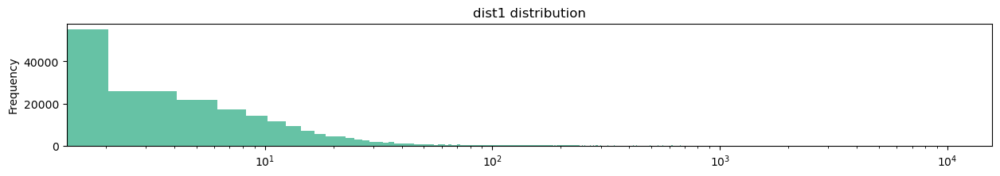

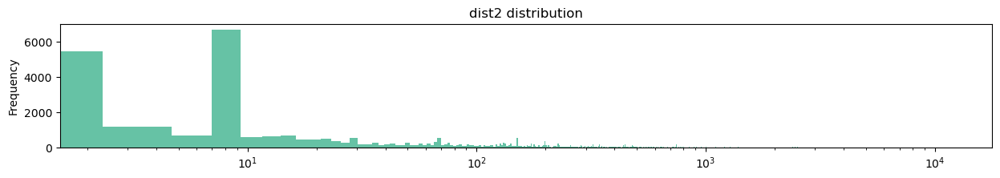

In [78]:
# Extract the first color from the 'Set2' palette
set2_palette = sns.color_palette('Set2')
color = set2_palette[0]

# Plot for 'dist1'
train_transaction_data['dist1'].plot(kind='hist',
                                     bins=5000,
                                     figsize=(15, 2),
                                     title='dist1 distribution',
                                     color=color,
                                     logx=True)
plt.show()

# Plot for 'dist2'
train_transaction_data['dist2'].plot(kind='hist',
                                     bins=5000,
                                     figsize=(15, 2),
                                     title='dist2 distribution',
                                     color=color,
                                     logx=True)
plt.show()

In [79]:
train_transaction_data[dist].isna().sum()

dist1    352271
dist2    552913
dtype: int64

In [80]:
train_transaction_data[dist].isna().sum()/len(train_transaction_data)*100

dist1    59.652352
dist2    93.628374
dtype: float64

## M1-M9

In [81]:
m_features = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']

In [82]:
train_transaction_data[m_features].head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,T,T,T,M2,F,T,null,null,null
1,null,null,null,M0,T,T,null,null,null
2,T,T,T,M0,F,F,F,F,F
3,null,null,null,M0,T,F,null,null,null
4,null,null,null,null,null,null,null,null,null


In [83]:
train_transaction_data[m_features].shape

(590540, 9)

In [84]:
train_transaction_data[m_features].dtypes

M1    object
M2    object
M3    object
M4    object
M5    object
M6    object
M7    object
M8    object
M9    object
dtype: object

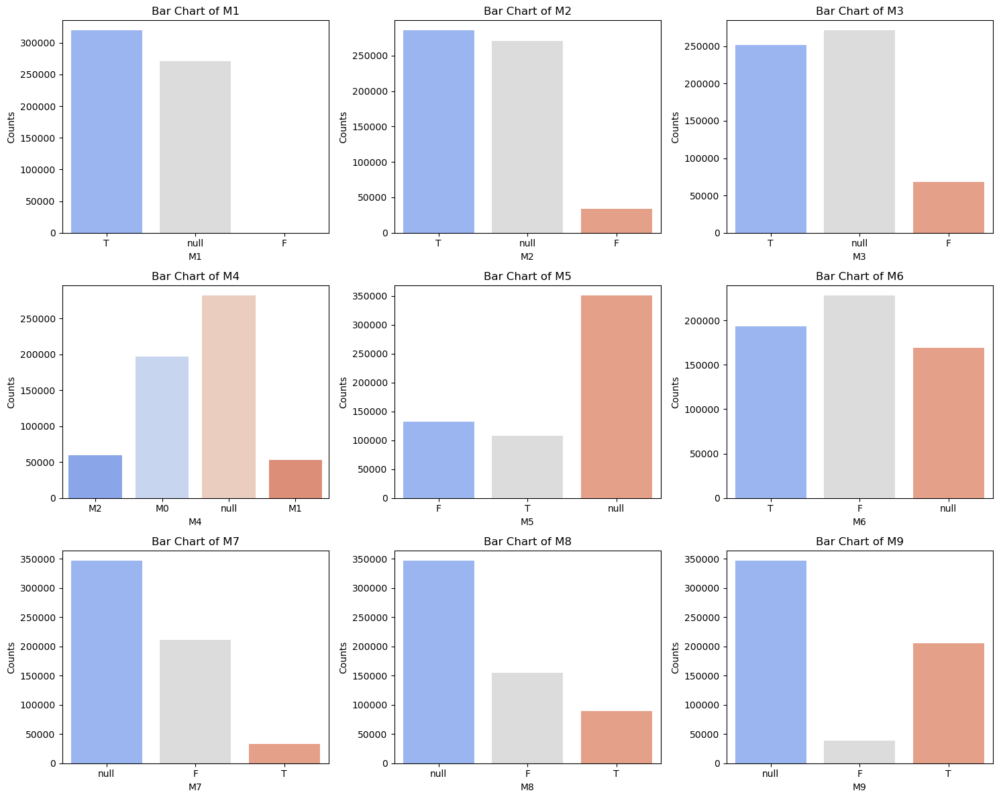

In [85]:
# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Loop through each feature and create a bar chart
for i, feature in enumerate(m_features):
    plt.subplot(3, 3, i+1)  # Adjust the grid dimensions (rows, columns) as needed
    sns.countplot(x=feature, data=train_transaction_data, palette='coolwarm')
    plt.title(f'Bar Chart of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Counts')

# Adjust layout
plt.tight_layout()
plt.show()

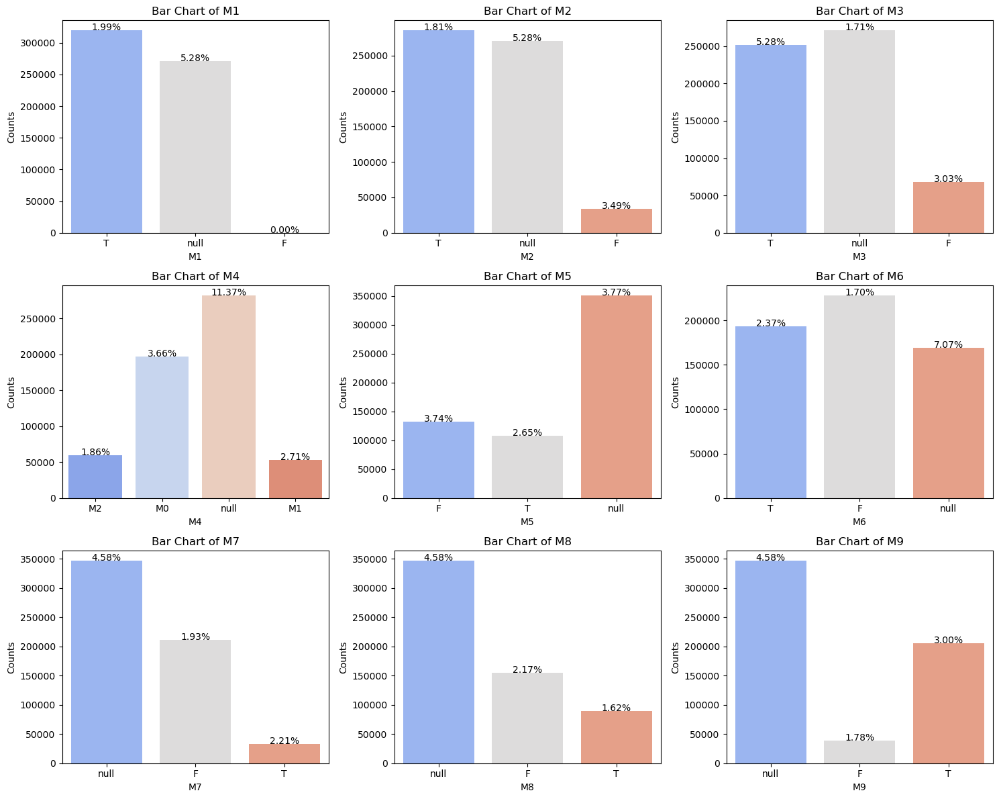

In [86]:
# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Loop through each feature and create a bar chart
for i, feature in enumerate(m_features):
    plt.subplot(3, 3, i+1)  # Adjust the grid dimensions (rows, columns) as needed
    ax = sns.countplot(x=feature, data=train_transaction_data, palette='coolwarm')
    plt.title(f'Bar Chart of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Counts')

    # Calculate the fraud percentage for each category
    total_counts = train_transaction_data[feature].value_counts()
    fraud_counts = train_transaction_data[train_transaction_data['isFraud'] == 1][feature].value_counts()
    fraud_percentage = (fraud_counts / total_counts * 100).reindex(total_counts.index).fillna(0)

    # Annotate bars with percentage
    for p, label in zip(ax.patches, total_counts.index):
        height = p.get_height()
        value = fraud_percentage[label]
        ax.text(p.get_x() + p.get_width() / 2., height + 5, '{:1.2f}%'.format(value), ha="center")

# Adjust layout
plt.tight_layout()
plt.show()

From this data, it can be rather derived that the highest Fraud were in unlabelled or null data for each of the categories of Mxx features. Aditionally, a balanced distribution was found between values of other features.

##### So not very useful in term of analysis.

In [87]:
(train_transaction_data[m_features] == 'null').sum()

M1    271100
M2    271100
M3    271100
M4    281444
M5    350482
M6    169360
M7    346265
M8    346252
M9    346252
dtype: int64

In [88]:
(train_transaction_data[m_features] == 'null').sum()/len(train_transaction_data[m_features])*100

M1    45.907136
M2    45.907136
M3    45.907136
M4    47.658753
M5    59.349409
M6    28.678836
M7    58.635317
M8    58.633115
M9    58.633115
dtype: float64

We can observe that the features M1 to M9 have varying percentages of missing values, with M6 having the least at approximately 28.68% and M5 the most at 59.35%. Various options for data imputation while pre-processing the data would have to be considered.

## P_emaildomain & R_emaildomain

## C1-C14

In [89]:
# Create a list of column names from 'C1' to 'C14'
c_cols = [f'C{i}' for i in range(1, 15)]

train_transaction_data[c_cols].head()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0
1,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
3,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0
4,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0


In [90]:
train_transaction_data[c_cols].isna().sum() 

C1     0
C2     0
C3     0
C4     0
C5     0
C6     0
C7     0
C8     0
C9     0
C10    0
C11    0
C12    0
C13    0
C14    0
dtype: int64

In [91]:
train_transaction_data[c_cols].nunique()

C1     1657
C2     1216
C3       27
C4     1260
C5      319
C6     1328
C7     1103
C8     1253
C9      205
C10    1231
C11    1476
C12    1199
C13    1597
C14    1108
dtype: int64

In [92]:
# Create a pair plot
#sns.pairplot(train_transaction_data[c_cols], diag_kind='kde')  # Use 'kde' for diagonal plots

# Show the plot
#plt.show()

In [93]:
train_transaction_data[c_cols].describe()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,14.092458,15.269734,0.005644,4.092185,5.571526,9.071082,2.848478,5.144574,4.480240,5.240343,10.241521,4.076227,32.539918,8.295215
std,133.569018,154.668899,0.150536,68.848459,25.786976,71.508467,61.727304,95.378574,16.674897,95.581443,94.336292,86.666218,129.364844,49.544262
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000
50%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,1.000000
75%,3.000000,3.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,0.000000,2.000000,0.000000,12.000000,2.000000
max,4685.000000,5691.000000,26.000000,2253.000000,349.000000,2253.000000,2255.000000,3331.000000,210.000000,3257.000000,3188.000000,3188.000000,2918.000000,1429.000000


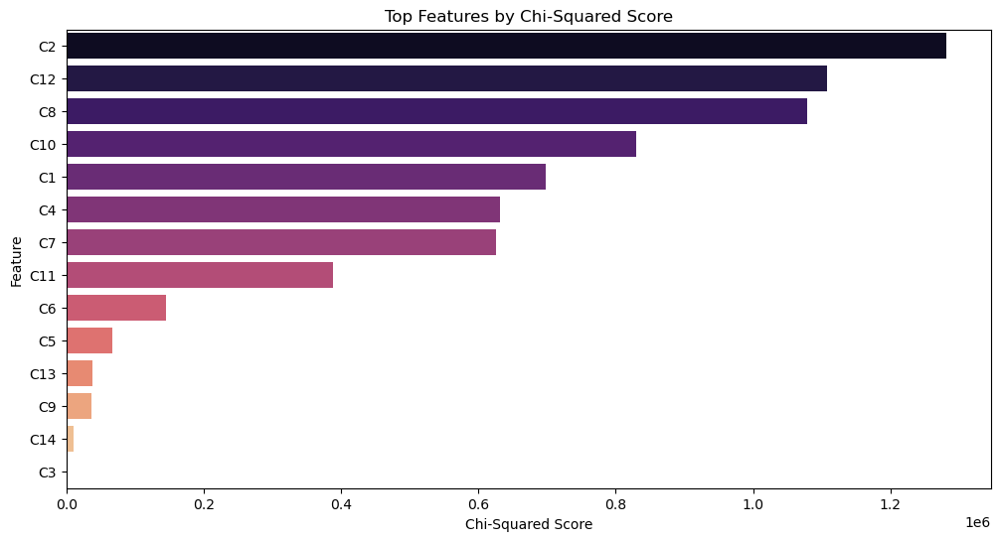

In [94]:
from sklearn.feature_selection import SelectKBest, chi2

# Assuming you have the target variable 'isFraud'
cxx_X = train_transaction_data[c_cols]
y = train_transaction_data['isFraud']

# Create a SelectKBest object with chi-squared test
selector = SelectKBest(score_func=chi2, k='all')

# Fit the selector to your data
selector.fit(cxx_X, y)

# Get the scores and p-values for each feature
scores = selector.scores_
p_values = selector.pvalues_

# Create a DataFrame to store feature names, scores, and p-values
feature_stats = pd.DataFrame({'Feature': c_cols, 'Score': scores, 'P-Value': p_values})

# Sort the features by their scores (higher score means more important)
cxx_top_features = feature_stats.sort_values(by='Score', ascending=False)

# Set up the matplotlib figure
plt.figure(figsize=(12, 6))

# Create a bar plot for the top features
sns.barplot(x='Score', y='Feature', data=cxx_top_features, palette='magma')

# Set labels and title
plt.xlabel('Chi-Squared Score')
plt.ylabel('Feature')
plt.title('Top Features by Chi-Squared Score')

# Show the plot
plt.show()

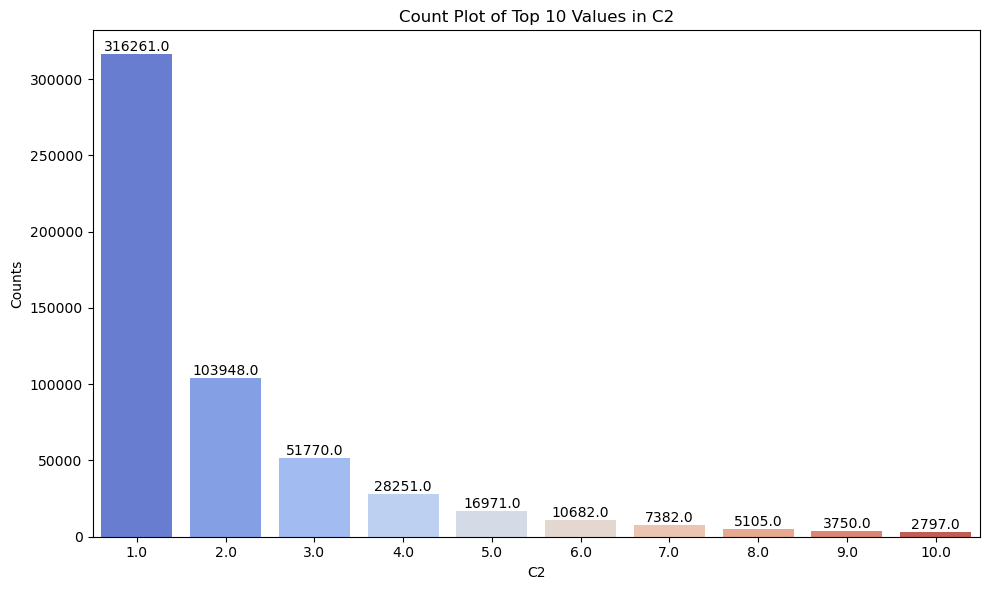

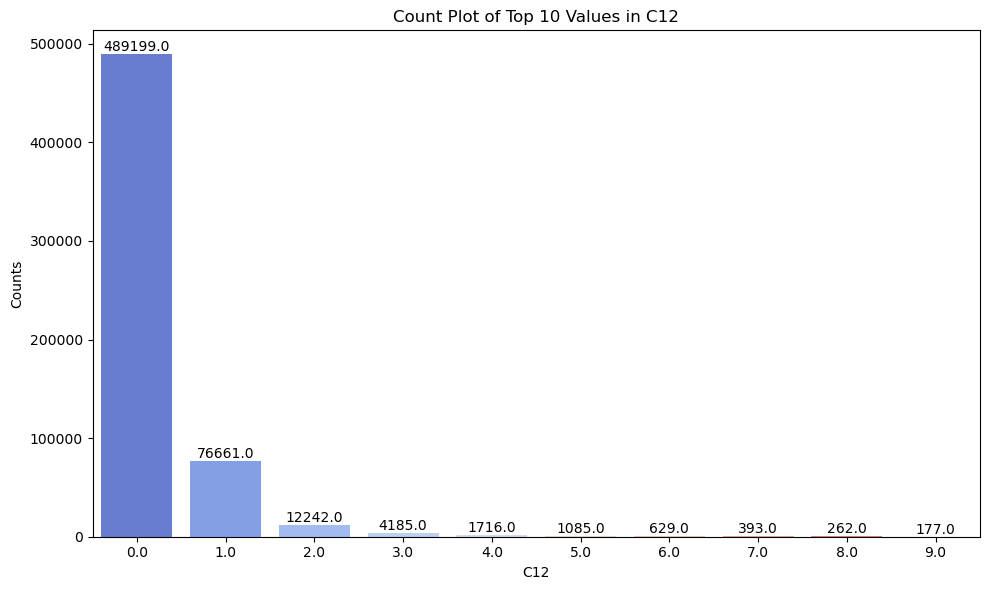

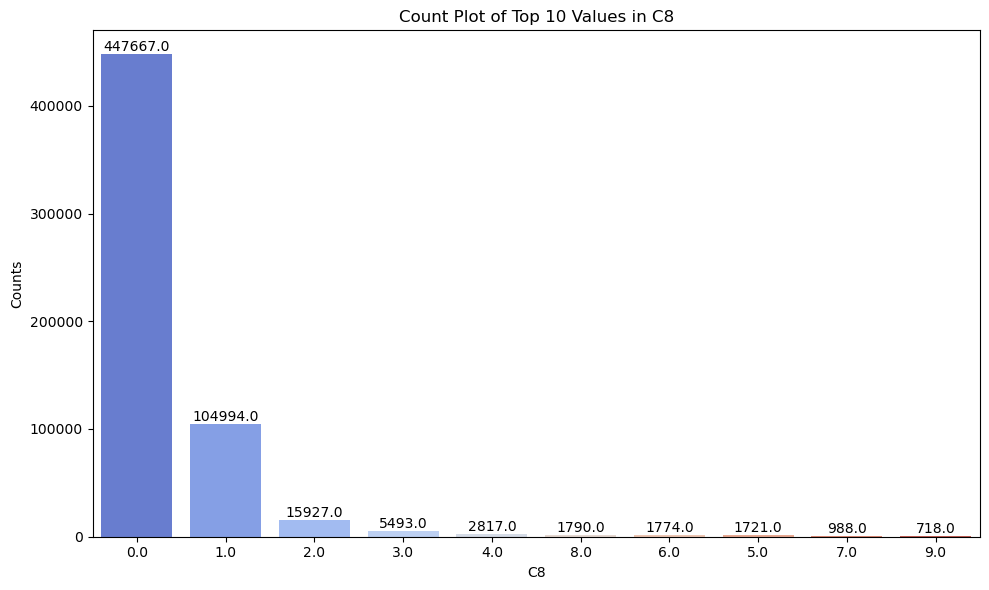

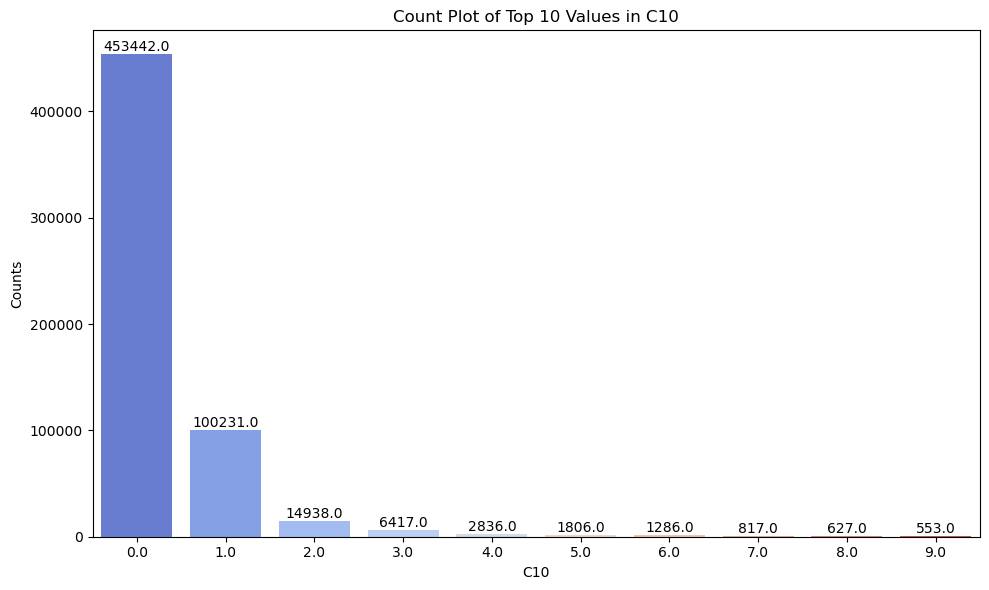

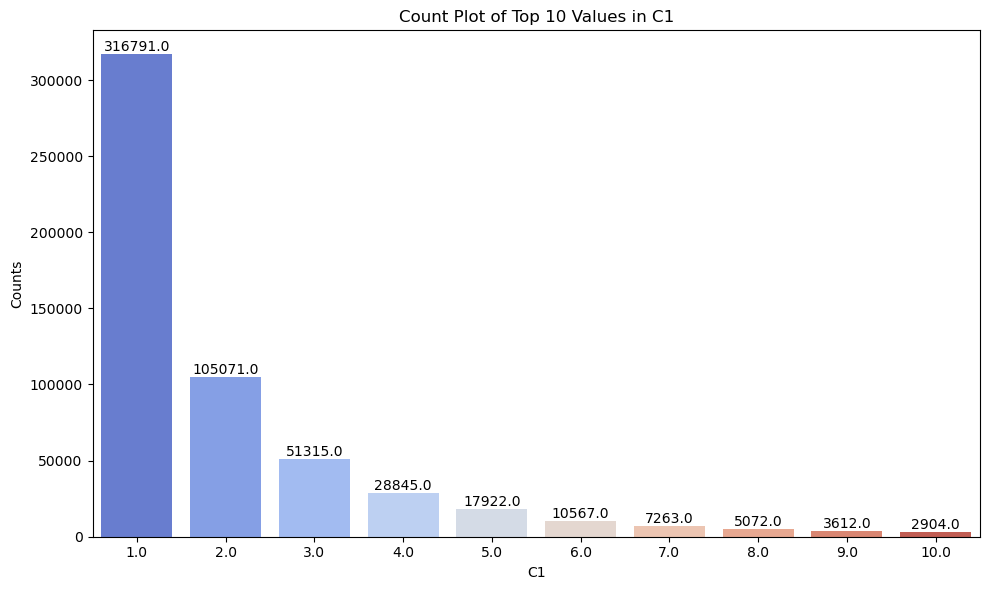

In [95]:
cxx_top_5 = cxx_top_features.head(5)

# Set the number of top values to display
top_n_values = 10

# Loop through each of the top 5 features
for i, feature in enumerate(cxx_top_5['Feature']):
    plt.figure(figsize=(10, 6))  # Set the figure size for each plot

    # Get the top 10 values for the current feature
    top_values = train_transaction_data[feature].value_counts().head(top_n_values)

    # Create a count plot for the top values
    ax = sns.countplot(x=feature, data=train_transaction_data, order=top_values.index, palette='coolwarm')
    plt.title(f'Count Plot of Top {top_n_values} Values in {feature}')
    plt.xlabel(feature)
    plt.ylabel('Counts')

    # Annotate the bars with the count
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()


## D1-D4

In [96]:
# Create a list of column names from 'D1' to 'D16'
d_cols = [f'D{i}' for i in range(1, 16)]

train_transaction_data[d_cols].head()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0
1,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0
2,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0
3,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0
4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
train_transaction_data[d_cols].isna().sum()

D1       1269
D2     280797
D3     262878
D4     168922
D5     309841
D6     517353
D7     551623
D8     515614
D9     515614
D10     76022
D11    279287
D12    525823
D13    528588
D14    528353
D15     89113
dtype: int64

In [98]:
train_transaction_data[d_cols].isna().sum()/len(train_transaction_data)*100

D1      0.214888
D2     47.549192
D3     44.514851
D4     28.604667
D5     52.467403
D6     87.606767
D7     93.409930
D8     87.312290
D9     87.312290
D10    12.873302
D11    47.293494
D12    89.041047
D13    89.509263
D14    89.469469
D15    15.090087
dtype: float64

In [99]:
train_transaction_data[d_cols].describe()

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
count,589271.000000,309743.000000,327662.000000,421618.000000,280699.000000,73187.000000,38917.000000,74926.000000,74926.000000,514518.000000,311253.000000,64717.000000,61952.000000,62187.000000,501427.000000
mean,94.347568,169.563231,28.343348,140.002441,42.335965,69.805717,41.638950,146.058108,0.561057,123.982137,146.621465,54.037533,17.901295,57.724444,163.744579
std,157.660387,177.315865,62.384721,191.096774,89.000144,143.669253,99.743264,231.663840,0.316880,182.615225,186.042622,124.274558,67.614425,136.312450,202.726660
min,0.000000,0.000000,0.000000,-122.000000,0.000000,-83.000000,0.000000,0.000000,0.000000,0.000000,-53.000000,-83.000000,0.000000,-193.000000,-83.000000
25%,0.000000,26.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.958333,0.208333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,97.000000,8.000000,26.000000,10.000000,0.000000,0.000000,37.875000,0.666666,15.000000,43.000000,0.000000,0.000000,0.000000,52.000000
75%,122.000000,276.000000,27.000000,253.000000,32.000000,40.000000,17.000000,187.958328,0.833333,197.000000,274.000000,13.000000,0.000000,2.000000,314.000000
max,640.000000,640.000000,819.000000,869.000000,819.000000,873.000000,843.000000,1707.791626,0.958333,876.000000,670.000000,648.000000,847.000000,878.000000,879.000000


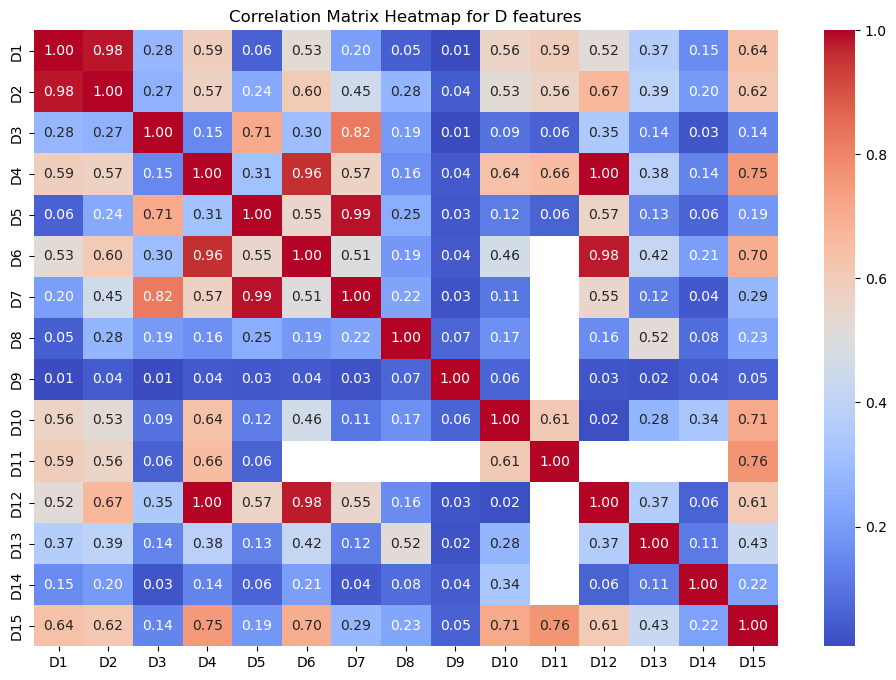

In [100]:
# Calculate the correlation matrix for D features
dxx_corr_matrix = train_transaction_data[d_cols].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(dxx_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap for D features')
plt.show()

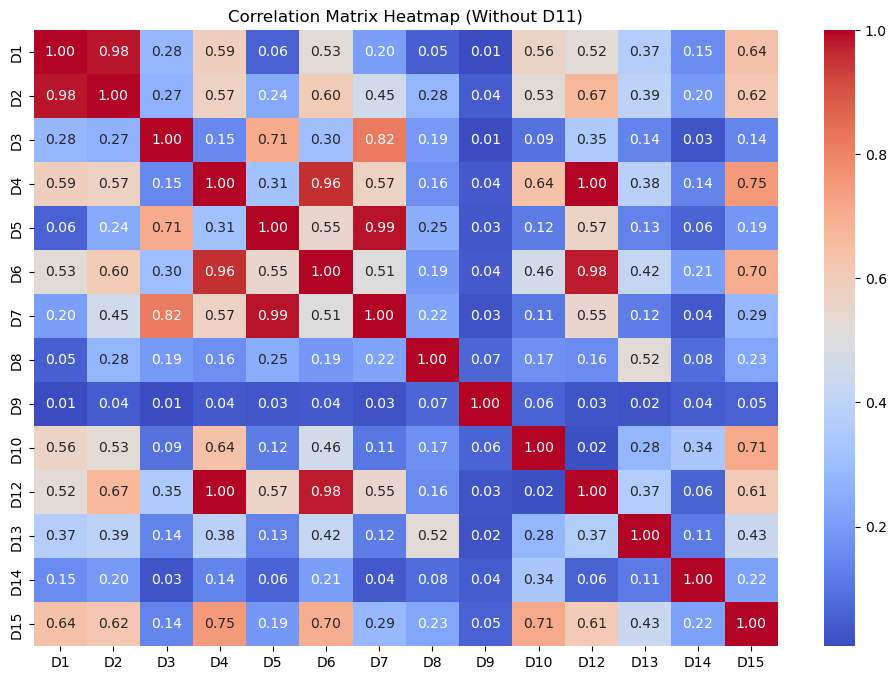

In [101]:
# Exclude 'D11' from the columns
excl_D11 = [col for col in d_cols if col != 'D11']

# Calculate the correlation matrix without 'D11'
dxx_corr_matrix = train_transaction_data[excl_D11].corr()

# Create a heatmap of the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(dxx_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap (Without D11)')
plt.show()

Skipping D11, because it seems that a lot of the features find a missing correlation between themselves and D11 which makes it complicated to derive trends. 

##### It could be useful to consider dropping that row for further analysis.

In [102]:
# Drop 'D11' column from test and train 
train_transaction_data.drop(['D11'], axis=1, inplace=True)
test_transaction_data.drop(['D11'], axis=1, inplace=True)

## V1-V339

In [103]:
#train_transaction_data.replace("null", np.nan, inplace=True)

In [104]:
train_transaction_data.head(20)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,V333,V334,V335,V336,V337,V338,V339,P_emaildomain_mapped,R_emaildomain_mapped,TransactionAmt_log
0,2987000,0,86400,68.500,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,null,null,4.241327
1,2987001,0,86401,29.000,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Gmail,null,3.401197
2,2987002,0,86469,59.000,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Outlook,null,4.094345
3,2987003,0,86499,50.000,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yahoo Mail,null,3.931826
4,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Gmail,null,3.931826
5,2987005,0,86510,49.000,W,5937,555.0,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Gmail,null,3.912023
6,2987006,0,86522,159.000,W,12308,360.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yahoo Mail,null,5.075174
7,2987007,0,86529,422.500,W,12695,490.0,150.0,visa,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Mail.com,null,6.048554
8,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Other,null,2.772589
9,2987009,0,86536,117.000,W,17399,111.0,150.0,mastercard,224.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yahoo Mail,null,4.770685


In [105]:
train_transaction_data.shape

(590540, 394)

In [106]:
import pandas as pd

# Assuming you have the train_transaction_data DataFrame already created

# Specify the file path where you want to save the CSV file
file_path = "train_transaction_data.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
train_transaction_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")


DataFrame exported to train_transaction_data.csv


In [107]:
# Specify the file path where you want to save the CSV file
file_path = "test_transaction_data.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
test_transaction_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")

DataFrame exported to test_transaction_data.csv


# Data Preprocessing

In [108]:
import gc
gc.collect()

16669

In [109]:
# Load the data
# Training data
train_identity_data = pd.read_csv('train_identity_data.csv')
train_transaction_data = pd.read_csv('train_transaction_data.csv')

# Testing data
test_identity_data = pd.read_csv('test_identity_data.csv')
test_transaction_data = pd.read_csv('test_transaction_data.csv')

In [110]:
# Merge the datasets based on TransactionID using a left join
traindata_left = pd.merge(train_transaction_data, train_identity_data, on='TransactionID', how='left')

# Explore the merged dataset
traindata_left.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,DeviceInfo_new,id_30_new,id_31_new
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2987002,0,86469,59.0,W,4663,490.0,150.0,visa,166.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2987003,0,86499,50.0,W,18132,567.0,150.0,mastercard,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2987004,0,86506,50.0,H,4497,514.0,150.0,mastercard,102.0,...,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M,SAMSUNG,Android,Samsung Browser


In [111]:
traindata_left.isna().sum() / len(traindata_left) * 100

TransactionID      0.000000
isFraud            0.000000
TransactionDT      0.000000
TransactionAmt     0.000000
ProductCD          0.000000
                    ...    
DeviceType        76.155722
DeviceInfo        79.905510
DeviceInfo_new    75.576083
id_30_new         75.576083
id_31_new         75.576083
Length: 437, dtype: float64

In [112]:
# Compute the percentage of null values in each column
left_train_null = (traindata_left.isna().sum() / traindata_left.shape[0]) * 100


# Compute the percentage of null values in the dataframe
overall_left_train_null = (traindata_left.isna().sum().sum() / (traindata_left.shape[0] * traindata_left.shape[1])) * 100

# Round the null percentage to 4 decimal places
overall_left_train_null = round(overall_left_train_null, 2)

# Print the overall null percentage in the dataset
print("\nPercentage of null values in the entire dataset:", overall_left_train_null, "%")


Percentage of null values in the entire dataset: 45.18 %


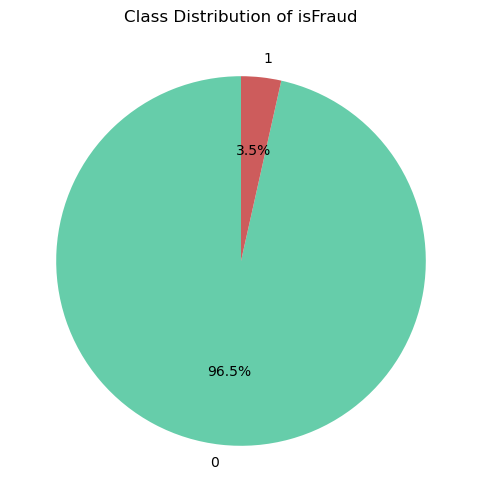

In [113]:
# Assuming 'traindata_left' is the DataFrame and 'isFraud' is the column representing the class labels
class_distribution = traindata_left['isFraud'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(6, 6))
plt.pie(class_distribution, labels=class_distribution.index, autopct='%1.1f%%', startangle=90, colors=['#66CDAA', '#CD5C5C'])
plt.title('Class Distribution of isFraud')
plt.show()

In [114]:
# Merge the datasets based on TransactionID using a inner join
traindata_inner = pd.merge(train_transaction_data, train_identity_data, on='TransactionID', how='inner')

# Explore the merged dataset
traindata_inner.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,DeviceInfo_new,id_30_new,id_31_new
0,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M,SAMSUNG,Android,Samsung Browser
1,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,match_status:1,T,F,F,T,mobile,iOS Device,iOS Device,iOS,Safari Mobile
2,2987010,0,86549,75.887,C,16496,352.0,117.0,mastercard,134.0,...,NaN,F,F,T,T,desktop,Windows,Windows,Missing,Chrome
3,2987011,0,86555,16.495,C,4461,375.0,185.0,mastercard,224.0,...,NaN,F,F,T,T,desktop,NaN,Missing,Missing,Chrome
4,2987016,0,86620,30.000,H,1790,555.0,150.0,visa,226.0,...,match_status:2,T,F,T,T,desktop,MacOS,MacOS,Mac OS,Chrome


In [115]:
# Check for missing values in the traindata_inner dataset
traindata_inner.isna().sum() / len(traindata_inner) * 100

TransactionID      0.000000
isFraud            0.000000
TransactionDT      0.000000
TransactionAmt     0.000000
ProductCD          0.000000
                    ...    
DeviceType         2.373243
DeviceInfo        17.726179
DeviceInfo_new     0.000000
id_30_new          0.000000
id_31_new          0.000000
Length: 437, dtype: float64

In [116]:
# Compute the percentage of null values in each column
inner_train_null = (traindata_inner.isnull().sum() / traindata_inner.shape[0]) * 100


# Compute the percentage of null values in the dataframe
overall_inner_train_null = (traindata_inner.isnull().sum().sum() / (traindata_inner.shape[0] * traindata_inner.shape[1])) * 100

# Round the null percentage to 4 decimal places
overall_inner_train_null = round(overall_inner_train_null, 4)

# Print the overall null percentage in the dataset
print("\nPercentage of null values in the entire dataset:", overall_inner_train_null, "%")


Percentage of null values in the entire dataset: 26.4807 %


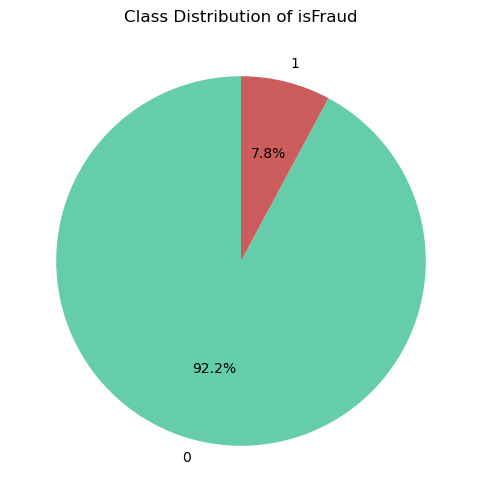

In [117]:
# Assuming 'traindata_inner' is the DataFrame and 'isFraud' is the class column
class_distribution = traindata_inner['isFraud'].value_counts()

# Plotting a pie chart
plt.figure(figsize=(6, 6))
plt.pie(class_distribution, labels=class_distribution.index, autopct='%1.1f%%', startangle=90, colors=['#66CDAA', '#CD5C5C'])
plt.title('Class Distribution of isFraud')
plt.show()

In [118]:
# Assigning the inner training dataset to 'train_data'
train_data = traindata_inner

In [119]:
train_data.shape

(144233, 437)

In [120]:
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,DeviceInfo_new,id_30_new,id_31_new
0,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,match_status:2,T,F,T,T,mobile,SAMSUNG SM-G892A Build/NRD90M,SAMSUNG,Android,Samsung Browser
1,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,match_status:1,T,F,F,T,mobile,iOS Device,iOS Device,iOS,Safari Mobile
2,2987010,0,86549,75.887,C,16496,352.0,117.0,mastercard,134.0,...,NaN,F,F,T,T,desktop,Windows,Windows,Missing,Chrome
3,2987011,0,86555,16.495,C,4461,375.0,185.0,mastercard,224.0,...,NaN,F,F,T,T,desktop,NaN,Missing,Missing,Chrome
4,2987016,0,86620,30.000,H,1790,555.0,150.0,visa,226.0,...,match_status:2,T,F,T,T,desktop,MacOS,MacOS,Mac OS,Chrome


In [121]:
# Drop 'DeviceInfo' and 'TransactionAmt_log' from the original DataFrame
train_data.drop(['DeviceInfo', 'TransactionAmt_log', 'id_30', 'id_31'], axis=1, inplace=True)

In [122]:
# Merge the datasets based on TransactionID using a inner join
test_data = pd.merge(test_transaction_data, test_identity_data, on='TransactionID', how='inner')

# Explore the merged dataset
test_data.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,DeviceInfo_new,id_30_new,id_31_new
0,3663586,18404013,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13,HUAWEI,Missing,Chrome Android
1,3663588,18404055,50.000,S,2453,399.0,150.0,american express,137.0,credit,...,match_status:2,T,F,T,T,mobile,LGLS676 Build/MXB48T,LG,Android,Chrome Android
2,3663597,18404235,37.318,C,15885,545.0,185.0,visa,138.0,debit,...,NaN,F,T,T,F,desktop,Trident/7.0,TRIDENT,Missing,IE Tablet
3,3663601,18404315,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,NaN,F,F,T,F,mobile,MYA-L13 Build/HUAWEIMYA-L13,HUAWEI,Missing,Chrome Android
4,3663602,18404359,52.258,C,9633,130.0,185.0,visa,138.0,debit,...,NaN,F,F,T,F,mobile,SM-G9650 Build/R16NW,SAMSUNG,Missing,Chrome Android


In [123]:
# Drop 'DeviceInfo' and 'TransactionAmt_log' from the original DataFrame
test_data.drop(['DeviceInfo', 'id_30', 'id_31'], axis=1, inplace=True)

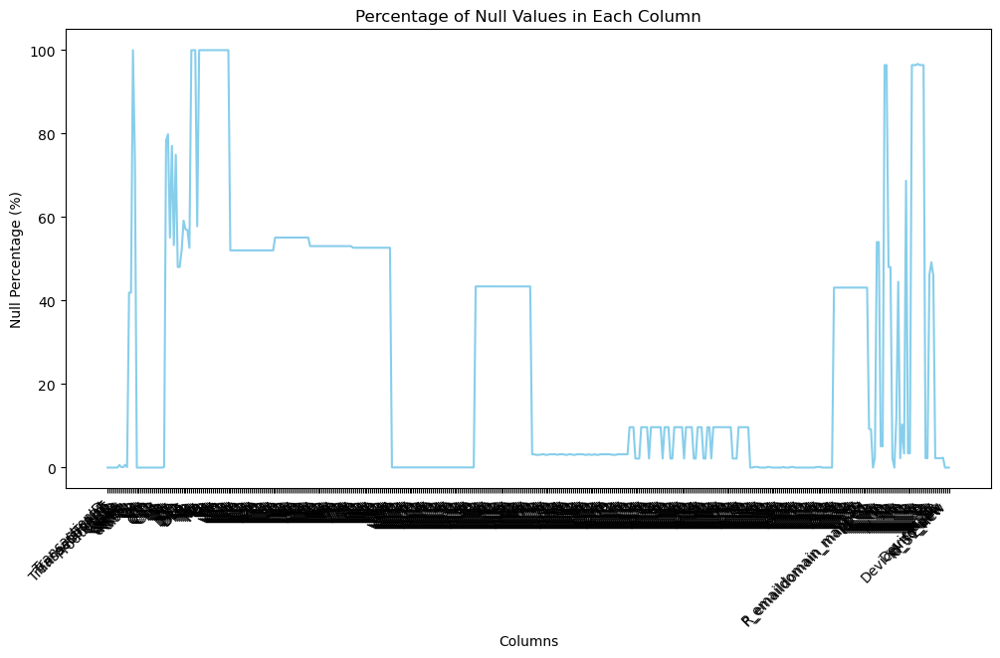

In [124]:
# Finding the Null value percentage in training set
null_train = (train_data.isnull().sum() / len(train_data)) * 100

# Plotting a line chart for null percentage
plt.figure(figsize=(12, 6))
null_train.plot(kind='line', color='skyblue')
plt.title('Percentage of Null Values in Each Column')
plt.xlabel('Columns')
plt.ylabel('Null Percentage (%)')
plt.xticks(range(len(null_train.index)), null_train.index, rotation=45, ha='right')
plt.show()

In [125]:
null_train.shape

(433,)

In [126]:
# Calculate null percentages for each column in the DataFrame
null_percentages = (train_data.isnull().sum() / len(train_data)) * 100

# Define the threshold values for categorization
high_threshold = 80  # Columns with 80% or more missing values
mid_threshold = 40   # Columns with more than 40% but less than the high threshold

# Create masks to categorize columns
high_quantile_mask = null_percentages >= high_threshold
mid_quantile_mask = (null_percentages > mid_threshold) & (null_percentages < high_threshold)
low_quantile_mask = null_percentages <= mid_threshold

# Get the column names for each category
high_quantile = null_percentages[high_quantile_mask].index.tolist()
mid_quantile = null_percentages[mid_quantile_mask].index.tolist()
low_quantile = null_percentages[low_quantile_mask].index.tolist()

# Print the results
print("Columns in High Quantile:")
print(high_quantile)

print("\nColumns in Mid Quantile:")
print(mid_quantile)

print("\nColumns in Low Quantile:")
print(low_quantile)

Columns in High Quantile:
['dist1', 'M1', 'M2', 'M3', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'id_07', 'id_08', 'id_21', 'id_22', 'id_23', 'id_24', 'id_25', 'id_26', 'id_27']

Columns in Mid Quantile:
['addr1', 'addr2', 'dist2', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D12', 'D13', 'D14', 'D15', 'M4', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V138', 'V139', 'V140', 'V141', 'V142', 'V1

In [127]:
# Remove 'isFraud' if it exists in the list
if 'isFraud' in low_quantile:
    low_quantile.remove('isFraud')

In [128]:
null_80 = (train_data[high_quantile].isna().sum()/len(train_data))*100
print("Features with 80% or more missing data:\n", null_80)

Features with 80% or more missing data:
 dist1    100.000000
M1       100.000000
M2       100.000000
M3       100.000000
M5       100.000000
M6       100.000000
M7       100.000000
M8       100.000000
M9       100.000000
V1       100.000000
V2       100.000000
V3       100.000000
V4       100.000000
V5       100.000000
V6       100.000000
V7       100.000000
V8       100.000000
V9       100.000000
V10      100.000000
V11      100.000000
id_07     96.425922
id_08     96.425922
id_21     96.423149
id_22     96.416215
id_23     96.416215
id_24     96.708798
id_25     96.441868
id_26     96.420375
id_27     96.416215
dtype: float64


In [129]:
null_80_40 = (train_data[mid_quantile].isna().sum()/len(train_data))*100
print("Features between 40% to 80% missing data:\n", null_80_40)

Features between 40% to 80% missing data:
 addr1    41.909272
addr2    41.909272
dist2    73.935923
D2       78.426574
D3       79.852738
           ...    
id_14    44.503685
id_18    68.722137
id_32    46.207872
id_33    49.187079
id_34    46.056034
Length: 156, dtype: float64


In [130]:
null_40 = (train_data[low_quantile].isna().sum()/len(train_data))*100
print("Features with 40% or less missing data:\n", null_40)

Features with 40% or less missing data:
 TransactionID     0.000000
TransactionDT     0.000000
TransactionAmt    0.000000
ProductCD         0.000000
card1             0.000000
                    ...   
id_38             2.251912
DeviceType        2.373243
DeviceInfo_new    0.000000
id_30_new         0.000000
id_31_new         0.000000
Length: 247, dtype: float64


In [131]:
# Drop columns in the high_quantile category
train_drop1 = train_data.drop(columns=high_quantile, inplace=True)

# DataFrame info after dropping columns
train_data.shape[1]

404

In [132]:
# Now, drop the same columns from test_data
test_data.drop(columns=high_quantile, inplace=True)

# Verify the shape of test_data
test_data.shape[1]

403

In [133]:
# Filter categorical features in the mid quantile directly
cat_mid_quant = train_data[mid_quantile][train_data[mid_quantile].select_dtypes(include=['object']).columns]

# Print the categorical features in the mid quantile
print("Categorical features in Mid Quantile:")
print(cat_mid_quant.columns.tolist())

Categorical features in Mid Quantile:
['M4', 'id_33', 'id_34']


In [134]:
# Check unique values in each categorical column of cat_low_quant
for column in cat_mid_quant.columns:
    unique_values = cat_mid_quant[column].unique()
    print(f"Unique values in '{column}': {unique_values}")

Unique values in 'M4': [nan 'M0' 'M2' 'M1']
Unique values in 'id_33': ['2220x1080' '1334x750' nan '1280x800' '1366x768' '1920x1080' '1680x1050'
 '1136x640' '5120x2880' '2880x1800' '1920x1200' '2560x1600' '2048x1536'
 '1024x768' '1280x720' '2560x1440' '2208x1242' '2001x1125' '1440x900'
 '1600x900' '2672x1440' '1280x1024' '960x540' '2732x2048' '2436x1125'
 '2048x1152' '2960x1440' '1024x600' '855x480' '4096x2304' '2160x1440'
 '2562x1442' '801x480' '2736x1824' '3441x1440' '2880x1620' '3840x2160'
 '1638x922' '1280x768' '1360x768' '1280x960' '3440x1440' '1152x720'
 '1280x1025' '3360x2100' '2304x1296' '1152x864' '3200x1800' '2112x1188'
 '2224x1668' '2400x1350' '2000x1125' '1600x1000' '2560x1080' '1728x972'
 '3000x2000' '1024x640' '3840x2400' '2304x1440' '1280x600' '1400x1050'
 '1600x1200' '3201x1800' '1356x900' '1344x756' '1624x1080' '1536x864'
 '1800x1125' '1920x1281' '2961x1442' '1366x1024' '1344x840' '3360x1890'
 '1536x1152' '1200x675' '1480x720' '2400x1600' '3200x2000' '1281x801'
 '960x64

In [135]:
from sklearn.preprocessing import LabelEncoder

# Define columns with missing values in the mid quantile
mid_quant_cols = train_data[mid_quantile]

# Separate categorical and numerical columns
mid_cat_cols = mid_quant_cols.select_dtypes(include=['object']).columns
mid_num_cols = mid_quant_cols.select_dtypes(exclude=['object']).columns

# Initialize LabelEncoders for categorical columns
label_encoders = {}
for column in mid_cat_cols:
    mid_quant_cols[column].fillna('Missing', inplace=True)
    label_encoders[column] = LabelEncoder()
    mid_quant_cols[column] = label_encoders[column].fit_transform(mid_quant_cols[column])

In [136]:
mid_quant_cols.head()

,addr1,addr2,dist2,D2,D3,D4,D5,D6,D7,D8,...,V339,id_03,id_04,id_09,id_10,id_14,id_18,id_32,id_33,id_34
0,420.0,87.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,-480.0,NaN,32.0,164,4
1,337.0,87.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,NaN,NaN,NaN,NaN,-300.0,NaN,32.0,48,3
2,NaN,NaN,NaN,1.0,0.0,0.0,0.0,0.0,0.0,83.0,...,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,260,0
3,NaN,NaN,30.0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,260,0
4,170.0,87.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.0,...,0.0,0.0,0.0,0.0,0.0,-300.0,15.0,24.0,40,4


In [137]:
train_data[mid_quantile] = mid_quant_cols

In [138]:
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,164,4,T,F,T,T,mobile,SAMSUNG,Android,Samsung Browser
1,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,48,3,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
2,2987010,0,86549,75.887,C,16496,352.0,117.0,mastercard,134.0,...,260,0,F,F,T,T,desktop,Windows,Missing,Chrome
3,2987011,0,86555,16.495,C,4461,375.0,185.0,mastercard,224.0,...,260,0,F,F,T,T,desktop,Missing,Missing,Chrome
4,2987016,0,86620,30.000,H,1790,555.0,150.0,visa,226.0,...,40,4,T,F,T,T,desktop,MacOS,Mac OS,Chrome


In [139]:
# Define columns with missing values in the mid quantile
test_mid_quant_cols = test_data[mid_quantile]

# Separate categorical and numerical columns
test_mid_cat_cols = test_mid_quant_cols.select_dtypes(include=['object']).columns
test_mid_num_cols = test_mid_quant_cols.select_dtypes(exclude=['object']).columns

# Initialize LabelEncoders for categorical columns
label_encoders = {}
for column in mid_cat_cols:
    test_mid_quant_cols[column].fillna('Missing', inplace=True)
    label_encoders[column] = LabelEncoder()
    test_mid_quant_cols[column] = label_encoders[column].fit_transform(test_mid_quant_cols[column])

In [140]:
test_mid_quant_cols.head()

,addr1,addr2,dist2,D2,D3,D4,D5,D6,D7,D8,...,V339,id_03,id_04,id_09,id_10,id_14,id_18,id_32,id_33,id_34
0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,15.0,NaN,390,0
1,494.0,87.0,37.0,34.0,1.0,NaN,NaN,634.0,1.0,22.0,...,0.0,0.0,0.0,0.0,0.0,-300.0,NaN,24.0,48,2
2,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-360.0,NaN,NaN,390,0
3,NaN,NaN,NaN,NaN,0.0,567.0,288.0,567.0,288.0,0.0,...,NaN,0.0,0.0,0.0,0.0,NaN,15.0,NaN,390,0
4,NaN,NaN,NaN,NaN,NaN,316.0,2.0,316.0,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,15.0,NaN,390,0


In [141]:
test_data[mid_quantile] = test_mid_quant_cols

In [142]:
test_data.head(15)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,3663586,18404013,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
1,3663588,18404055,50.000,S,2453,399.0,150.0,american express,137.0,credit,...,48,2,T,F,T,T,mobile,LG,Android,Chrome Android
2,3663597,18404235,37.318,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,T,T,F,desktop,TRIDENT,Missing,IE Tablet
3,3663601,18404315,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
4,3663602,18404359,52.258,C,9633,130.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,SAMSUNG,Missing,Chrome Android
5,3663622,18404814,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
6,3663624,18404835,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
7,3663626,18404886,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
8,3663629,18405020,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
9,3663658,18405854,25.000,R,5721,225.0,150.0,mastercard,224.0,debit,...,196,2,T,F,F,F,mobile,iOS Device,iOS,Safari Mobile


In [143]:
train_data[mid_quantile].isna().sum()

addr1     60447
addr2     60447
dist2    106640
D2       113117
D3       115174
          ...  
id_14     64189
id_18     99120
id_32     66647
id_33         0
id_34         0
Length: 156, dtype: int64

In [144]:
%%time

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Initialize the MICE imputer for numerical columns
mice_imputer = IterativeImputer(max_iter=10, random_state=0)

# Perform MICE imputation for numerical columns
mid_quant_cols[mid_num_cols] = mice_imputer.fit_transform(mid_quant_cols[mid_num_cols])

# Replace the original mid quantile columns with the imputed values
train_data[mid_quantile] = mid_quant_cols

CPU times: user 2h 36min 22s, sys: 7min 25s, total: 2h 43min 47s
Wall time: 21min 22s


In [145]:
train_data[mid_quantile].head()

,addr1,addr2,dist2,D2,D3,D4,D5,D6,D7,D8,...,V339,id_03,id_04,id_09,id_10,id_14,id_18,id_32,id_33,id_34
0,420.000000,87.000000,615.945575,123.092685,-588.160759,3518.953449,-1561.528919,23358.927924,6185.297593,572.058108,...,0.000000,121.560189,-233.058938,-378.408977,490.698876,-480.000000,92.237337,32.000000,164,4
1,337.000000,87.000000,-1432.054425,-228.907315,-259.160759,3422.953449,-14873.528919,20670.927924,7209.297593,444.058108,...,0.000000,153.560189,-105.058938,-250.408977,426.698876,-300.000000,76.237337,32.000000,48,3
2,707.986187,287.093458,-3490.108192,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,83.000000,...,3193.543786,0.000000,0.000000,0.000000,0.000000,-1242.638137,19.999195,1304.995286,260,0
3,708.741120,286.860338,30.000000,685.710011,-217.095981,0.000000,1309.446750,0.000000,-4986.554136,-795.428375,...,3167.187311,15.191999,-185.568557,407.432194,-1039.686089,-1248.572782,19.444457,1320.125131,260,0
4,170.000000,87.000000,-19864.054425,2107.092685,-1265.160759,9758.953449,15846.471081,17150.927924,4137.297593,26.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,-300.000000,15.000000,24.000000,40,4


In [146]:
train_data.head(15)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987004,0,86506,50.000,H,4497,514.0,150.0,mastercard,102.0,...,164,4,T,F,T,T,mobile,SAMSUNG,Android,Samsung Browser
1,2987008,0,86535,15.000,H,2803,100.0,150.0,visa,226.0,...,48,3,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
2,2987010,0,86549,75.887,C,16496,352.0,117.0,mastercard,134.0,...,260,0,F,F,T,T,desktop,Windows,Missing,Chrome
3,2987011,0,86555,16.495,C,4461,375.0,185.0,mastercard,224.0,...,260,0,F,F,T,T,desktop,Missing,Missing,Chrome
4,2987016,0,86620,30.000,H,1790,555.0,150.0,visa,226.0,...,40,4,T,F,T,T,desktop,MacOS,Mac OS,Chrome
5,2987017,0,86668,100.000,H,11492,111.0,150.0,mastercard,219.0,...,60,4,T,F,T,T,desktop,Windows,Windows,Chrome
6,2987022,0,86786,50.000,H,1724,583.0,150.0,visa,226.0,...,260,0,NaN,NaN,NaN,NaN,NaN,Missing,Missing,Missing
7,2987038,0,87172,25.000,S,5463,399.0,150.0,american express,137.0,...,132,4,T,F,T,T,mobile,Missing,Android,Chrome
8,2987040,0,87209,75.887,C,13329,569.0,117.0,visa,226.0,...,260,0,F,F,T,T,desktop,Windows,Missing,Chrome
9,2987048,0,87317,42.294,C,15885,545.0,185.0,visa,138.0,...,260,0,F,F,T,T,desktop,Windows,Missing,Chrome


In [147]:
%%time

# Initialize the MICE imputer for numerical columns
mice_imputer = IterativeImputer(max_iter=10, random_state=0)

# Perform MICE imputation for numerical columns
test_mid_quant_cols[test_mid_num_cols] = mice_imputer.fit_transform(test_mid_quant_cols[test_mid_num_cols])

# Replace the original mid quantile columns with the imputed values
test_data[mid_quantile] = test_mid_quant_cols

CPU times: user 3h 14min 37s, sys: 13min 12s, total: 3h 27min 50s
Wall time: 26min 51s


In [148]:
test_data[mid_quantile].head()

,addr1,addr2,dist2,D2,D3,D4,D5,D6,D7,D8,...,V339,id_03,id_04,id_09,id_10,id_14,id_18,id_32,id_33,id_34
0,655.042252,1078.121134,129.195207,-113.648047,79.741764,0.000000,-698.717505,0.0,-3713.986298,62.834483,...,1.138973e+25,-42.696992,-38.087454,-119.423781,149.754123,-15638.482672,15.000000,-7.208698e+05,390,0
1,494.000000,87.000000,37.000000,34.000000,1.000000,128.663946,837.281676,634.0,1.000000,22.000000,...,0.000000e+00,0.000000,0.000000,0.000000,0.000000,-300.000000,23.045740,2.400000e+01,48,2
2,463.042252,1110.121134,289.195207,-129.648047,-816.258236,0.000000,-2234.717505,0.0,-6209.986298,30.834483,...,1.179016e+25,-61.696992,-34.087454,-94.423781,109.754123,-360.000000,-44.766765,-1.965818e+05,390,0
3,911.042252,1606.121134,129.195207,-369.648047,0.000000,567.000000,288.000000,567.0,288.000000,0.000000,...,1.534261e+25,0.000000,0.000000,0.000000,0.000000,-8470.482672,15.000000,2.752538e+06,390,0
4,335.042252,550.121134,129.195207,-1.648047,335.741764,316.000000,2.000000,316.0,2.000000,198.834483,...,1.242580e+25,-62.696992,-34.087454,-74.423781,109.754123,-6678.482672,15.000000,1.310746e+06,390,0


In [149]:
test_data.head(15)

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,3663586,18404013,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
1,3663588,18404055,50.000,S,2453,399.0,150.0,american express,137.0,credit,...,48,2,T,F,T,T,mobile,LG,Android,Chrome Android
2,3663597,18404235,37.318,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,T,T,F,desktop,TRIDENT,Missing,IE Tablet
3,3663601,18404315,6.271,C,15885,545.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,HUAWEI,Missing,Chrome Android
4,3663602,18404359,52.258,C,9633,130.0,185.0,visa,138.0,debit,...,390,0,F,F,T,F,mobile,SAMSUNG,Missing,Chrome Android
5,3663622,18404814,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
6,3663624,18404835,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
7,3663626,18404886,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
8,3663629,18405020,50.000,H,12839,321.0,150.0,visa,226.0,debit,...,218,2,T,F,F,T,mobile,iOS Device,iOS,Safari Mobile
9,3663658,18405854,25.000,R,5721,225.0,150.0,mastercard,224.0,debit,...,196,2,T,F,F,F,mobile,iOS Device,iOS,Safari Mobile


In [150]:
# Separate categorical and numerical columns in low quantile
low_cat_cols = train_data[low_quantile].select_dtypes(include=['object']).columns
low_num_cols = train_data[low_quantile].select_dtypes(exclude=['object']).columns

In [151]:
# Print the categorical features in the low quantile
print("Categorical features in Low Quantile:")
print(low_cat_cols.tolist())

Categorical features in Low Quantile:
['ProductCD', 'card4', 'card6', 'P_emaildomain_mapped', 'R_emaildomain_mapped', 'id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo_new', 'id_30_new', 'id_31_new']


In [152]:
# Check unique values in each categorical column of cat_low_quant
for column in train_data[low_quantile][train_data[low_quantile].select_dtypes(include=['object']).columns].columns:
    unique_values = train_data[low_quantile][train_data[low_quantile].select_dtypes(include=['object']).columns][column].unique()
    print(f"Unique values in '{column}': {unique_values}\n")

Unique values in 'ProductCD': ['H' 'C' 'S' 'R']

Unique values in 'card4': ['mastercard' 'visa' 'american express' 'discover' nan]

Unique values in 'card6': ['credit' 'debit' nan 'charge card']

Unique values in 'P_emaildomain_mapped': ['Gmail' 'Other' 'Outlook' 'AOL' 'Yahoo Mail' nan 'Charter' 'Comcast'
 'Optonline' 'EarthLink' 'Apple iCloud' 'Juno' 'AT&T' 'MSN' 'Cox'
 'Servicios TA' 'Verizon' 'BellSouth' 'SBCGlobal' 'GMX' 'Mail.com'
 'Frontier' 'Suddenlink' 'Roadrunner' 'Web.de' 'TWC' 'Windstream' 'CFL'
 'Q' 'Prodigy' 'NetZero' 'CableOne' 'PTD' 'CenturyLink' 'SC' 'ProtonMail']

Unique values in 'R_emaildomain_mapped': [nan 'Gmail' 'Outlook' 'Other' 'Charter' 'Comcast' 'Apple iCloud'
 'Yahoo Mail' 'AOL' 'Juno' 'AT&T' 'Verizon' 'BellSouth' 'Servicios TA'
 'MSN' 'Optonline' 'GMX' 'Mail.com' 'Cox' 'EarthLink' 'Web.de' 'SBCGlobal'
 'TWC' 'Roadrunner' 'Frontier' 'Q' 'Prodigy' 'Windstream' 'Suddenlink'
 'PTD' 'CFL' 'NetZero' 'CenturyLink' 'ProtonMail' 'CableOne' 'SC']

Unique values in 'id

Unique values in 'id_30_new': ['Android' 'iOS' 'Missing' 'Mac OS' 'Windows' 'Linux' 'func' 'other']

Unique values in 'id_31_new': ['Samsung Browser' 'Safari Mobile' 'Chrome' 'Missing' 'Chrome Android'
 'Edge' 'Safari' 'Firefox' 'Chrome iOS' 'IE Desktop' 'IE Tablet' 'other'
 'IE' 'Opera' 'Android' 'mobile' 'Samsung' 'aol' 'silk' 'waterfox'
 'nokia/lumia' 'puffin' 'microsoft/windows' 'cyberfox' 'zte/blade'
 'palemoon' 'maxthon' 'line' 'lg/k-200' 'iron' 'blu/dash' 'seamonkey'
 'm4tel/m4' 'comodo' 'lanix/ilium' 'chromium' 'inco/minion' 'cherry'
 'icedragon' 'Google' 'facebook' 'Firefox Mobile']



In [153]:
%%time

from sklearn.impute import KNNImputer

# Assuming you've already defined low_quantile
low_num_cols = train_data[low_quantile].select_dtypes(exclude=['object']).columns

# Create a KNNImputer object
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Fit and transform the imputer on the selected columns
knn_imputed_values = knn_imputer.fit_transform(train_data[low_quantile][low_num_cols])

# Replace the original values in the main train_data DataFrame with the imputed values
train_data.loc[train_data[low_quantile].index, low_num_cols] = knn_imputed_values

CPU times: user 1h 1min 7s, sys: 5min 16s, total: 1h 6min 24s
Wall time: 59min 3s


In [154]:
from sklearn.preprocessing import LabelEncoder

# Define columns with missing values in the low quantile
low_quant_cols = train_data[low_quantile]

# Define a list of categorical columns excluding 'DeviceInfo_new' and other excluded columns
excluded_cols_low = ['DeviceInfo_new', 'P_emaildomain_mapped', 'R_emaildomain_mapped', 'id_31_new', 'id_30_new']
cat_cols_low = [col for col in low_quant_cols.select_dtypes(include=['object']).columns if col not in excluded_cols_low]

# Separate categorical and numerical columns
low_cat_cols = low_quant_cols.select_dtypes(include=['object']).columns
low_num_cols = low_quant_cols.select_dtypes(exclude=['object']).columns

# Initialize LabelEncoders for categorical columns in excluded_cols_low
label_encoders = {}
for column in cat_cols_low:
    if column in low_quant_cols.columns and low_quant_cols[column].dtype == 'object':
        low_quant_cols[column].fillna('Missing', inplace=True)
        label_encoders[column] = LabelEncoder()
        low_quant_cols[column] = label_encoders[column].fit_transform(low_quant_cols[column])

In [155]:
train_data[low_quantile] = low_quant_cols

In [156]:
train_data[low_quantile].head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_28,id_29,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,2987004,86506,50.000,1,4497,514.0,150.0,3,102.0,2,...,2,2,2,0,2,2,2,SAMSUNG,Android,Samsung Browser
1,2987008,86535,15.000,1,2803,100.0,150.0,4,226.0,3,...,2,2,2,0,0,2,2,iOS Device,iOS,Safari Mobile
2,2987010,86549,75.887,0,16496,352.0,117.0,3,134.0,2,...,0,0,0,0,2,2,1,Windows,Missing,Chrome
3,2987011,86555,16.495,0,4461,375.0,185.0,3,224.0,3,...,2,2,0,0,2,2,1,Missing,Missing,Chrome
4,2987016,86620,30.000,1,1790,555.0,150.0,4,226.0,3,...,0,0,2,0,2,2,1,MacOS,Mac OS,Chrome


In [157]:
#train_data[cat_cols_low].head()

In [158]:
from sklearn.preprocessing import OneHotEncoder

# Assuming 'low_quant_cols', 'train_data', and 'excluded_cols_low' are already defined

# Selecting categorical columns for encoding
#cat_cols_low = [col for col in low_quant_cols.select_dtypes(include=['object']).columns if col not in excluded_cols_low]

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse=False, drop=None)

# Fit and transform the encoder on the selected categorical columns
encoded_data = encoder.fit_transform(train_data[excluded_cols_low])

# Get the feature names using the 'get_feature_names_out' method
feature_names = encoder.get_feature_names_out(excluded_cols_low)

# Create a DataFrame from the encoded data with column names
encoded_df = pd.DataFrame(encoded_data, columns=feature_names)

# Drop original categorical columns from train_data
train_data = train_data.drop(columns=excluded_cols_low)

# Concatenate the one-hot encoded columns with the main DataFrame
train_data = pd.concat([train_data, encoded_df], axis=1)

In [159]:
# Check the updated train_data DataFrame
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31_new_waterfox,id_31_new_zte/blade,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Missing,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
0,2987004,0,86506,50.000,1,4497,514.0,150.0,3,102.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2987008,0,86535,15.000,1,2803,100.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,2987010,0,86549,75.887,0,16496,352.0,117.0,3,134.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,2987011,0,86555,16.495,0,4461,375.0,185.0,3,224.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,2987016,0,86620,30.000,1,1790,555.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [160]:
train_data.shape

(144233, 1020)

In [161]:
train_data.columns

Index(['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5',
       ...
       'id_31_new_waterfox', 'id_31_new_zte/blade', 'id_30_new_Android',
       'id_30_new_Linux', 'id_30_new_Mac OS', 'id_30_new_Missing',
       'id_30_new_Windows', 'id_30_new_func', 'id_30_new_iOS',
       'id_30_new_other'],
      dtype='object', length=1020)

In [162]:
# Get a list of columns that end with '_nan' or '_Missing'
nan_ending_columns = [col for col in train_data.columns if col.endswith(('_nan', '_Missing'))]

# Display the list
print(nan_ending_columns)

['DeviceInfo_new_Missing', 'P_emaildomain_mapped_nan', 'R_emaildomain_mapped_nan', 'id_31_new_Missing', 'id_30_new_Missing']


In [163]:
# Drop these columns from train_data
train_data = train_data.drop(columns=nan_ending_columns)

# Display the updated DataFrame
train_data.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31_new_silk,id_31_new_waterfox,id_31_new_zte/blade,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
0,2987004,0,86506,50.000,1,4497,514.0,150.0,3,102.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2987008,0,86535,15.000,1,2803,100.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,2987010,0,86549,75.887,0,16496,352.0,117.0,3,134.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2987011,0,86555,16.495,0,4461,375.0,185.0,3,224.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2987016,0,86620,30.000,1,1790,555.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [164]:
# Check for missing values in train_data[low_quantile]
missing_value_columns = train_data.columns[train_data.isna().any()].tolist()

# Display the result
if missing_value_columns:
    print("Columns with missing values in test_data:", missing_value_columns)
else:
    print("There are no missing values in test_data.")

There are no missing values in test_data.


In [165]:
# Specify the file path where you want to save the CSV file
file_path = "traindata_cleaned.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
train_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")

DataFrame exported to traindata_cleaned.csv


In [166]:
# Create a list of columns in the low_quantile category
#low_quantile = null_percentages[low_quantile_mask].index.tolist()

# Remove 'isFraud' if it exists in the list
#if 'isFraud' in low_quantile:
#    low_quantile.remove('isFraud')

In [167]:
# Separate categorical and numerical columns in low_quantile for test_data
test_low_cat_cols = test_data.select_dtypes(include=['object']).columns
test_low_num_cols = test_data.select_dtypes(exclude=['object']).columns

In [168]:
# Print the categorical features in the low quantile
print("Categorical features in Low Quantile:")
print(test_low_cat_cols.tolist())

Categorical features in Low Quantile:
['ProductCD', 'card4', 'card6', 'P_emaildomain_mapped', 'R_emaildomain_mapped', 'id_12', 'id_15', 'id_16', 'id_28', 'id_29', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType', 'DeviceInfo_new', 'id_30_new', 'id_31_new']


In [169]:
%%time

from sklearn.impute import KNNImputer

# Assuming you've already defined low_quantile
test_low_num_cols = test_data[low_quantile].select_dtypes(exclude=['object']).columns

# Create a KNNImputer object
knn_imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Fit and transform the imputer on the selected columns
knn_imputed_values_test = knn_imputer.fit_transform(test_data[low_quantile][test_low_num_cols])

# Replace the original values in the main train_data DataFrame with the imputed values
test_data.loc[test_data[low_quantile].index, test_low_num_cols] = knn_imputed_values_test

CPU times: user 1h 6min 13s, sys: 5min 18s, total: 1h 11min 31s
Wall time: 1h 26min 53s


In [170]:
from sklearn.preprocessing import LabelEncoder

# Define columns with missing values in the low quantile
test_low_quant_cols = test_data[low_quantile]

# Define a list of categorical columns excluding 'DeviceInfo_new' and other excluded columns
test_excluded_cols_low = ['DeviceInfo_new', 'P_emaildomain_mapped', 'R_emaildomain_mapped', 'id_31_new', 'id_30_new' ]
test_cat_cols_low = [col for col in test_low_quant_cols.select_dtypes(include=['object']).columns if col not in test_excluded_cols_low]

# Separate categorical and numerical columns
test_low_cat_cols = test_low_quant_cols.select_dtypes(include=['object']).columns
test_low_num_cols = test_low_quant_cols.select_dtypes(exclude=['object']).columns

# Initialize LabelEncoders for categorical columns in excluded_cols_low
label_encoders = {}
for column in test_cat_cols_low:
    if column in test_low_quant_cols.columns and test_low_quant_cols[column].dtype == 'object':
        test_low_quant_cols[column].fillna('Missing', inplace=True)
        label_encoders[column] = LabelEncoder()
        test_low_quant_cols[column] = label_encoders[column].fit_transform(test_low_quant_cols[column])

In [171]:
test_data[low_quantile] = test_low_quant_cols

In [172]:
test_data[low_quantile].head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_28,id_29,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo_new,id_30_new,id_31_new
0,3663586,18404013,6.271,0,15885,545.0,185.0,4,138.0,3,...,2,2,0,0,2,0,2,HUAWEI,Missing,Chrome Android
1,3663588,18404055,50.000,3,2453,399.0,150.0,1,137.0,2,...,0,0,2,0,2,2,2,LG,Android,Chrome Android
2,3663597,18404235,37.318,0,15885,545.0,185.0,4,138.0,3,...,2,2,0,2,2,0,1,TRIDENT,Missing,IE Tablet
3,3663601,18404315,6.271,0,15885,545.0,185.0,4,138.0,3,...,0,0,0,0,2,0,2,HUAWEI,Missing,Chrome Android
4,3663602,18404359,52.258,0,9633,130.0,185.0,4,138.0,3,...,2,2,0,0,2,0,2,SAMSUNG,Missing,Chrome Android


In [173]:
test_data[cat_cols_low].head()

,ProductCD,card4,card6,id_12,id_15,id_16,id_28,id_29,id_35,id_36,id_37,id_38,DeviceType
0,0,4,3,1,2,2,2,2,0,0,2,0,2
1,3,1,2,0,0,0,0,0,2,0,2,2,2
2,0,4,3,1,2,2,2,2,0,2,2,0,1
3,0,4,3,1,0,0,0,0,0,0,2,0,2
4,0,4,3,1,2,2,2,2,0,0,2,0,2


In [175]:
from sklearn.preprocessing import OneHotEncoder

# Assuming 'low_quant_cols', 'train_data', and 'excluded_cols_low' are already defined

# Selecting categorical columns for encoding
#test_cat_cols_low = [col for col in test_low_quant_cols.select_dtypes(include=['object']).columns if col not in test_excluded_cols_low]

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse=False, drop=None)

# Fit and transform the encoder on the selected categorical columns
test_encoded_data = encoder.fit_transform(test_data[test_excluded_cols_low])

# Get the feature names using the 'get_feature_names_out' method
test_feature_names = encoder.get_feature_names_out(test_excluded_cols_low)

# Create a DataFrame from the encoded data with column names
test_encoded_df = pd.DataFrame(test_encoded_data, columns=test_feature_names)

# Drop original categorical columns from train_data
test_data = test_data.drop(columns=test_excluded_cols_low)

# Concatenate the one-hot encoded columns with the main DataFrame
test_data = pd.concat([test_data, test_encoded_df], axis=1)

In [176]:
# Get a list of columns that end with '_nan' or '_Missing'
test_nan_ending = [col for col in test_data.columns if col.endswith(('_nan', '_Missing'))]

# Display the list
print(test_nan_ending)

['DeviceInfo_new_Missing', 'P_emaildomain_mapped_nan', 'R_emaildomain_mapped_nan', 'id_31_new_Missing', 'id_30_new_Missing']


In [177]:
# Drop these columns from train_data
test_data = test_data.drop(columns=test_nan_ending)

# Display the updated DataFrame
test_data.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_31_new_palemoon,id_31_new_rim,id_31_new_uc,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
0,3663586,18404013,6.271,0,15885,545.0,185.0,4,138.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,3663588,18404055,50.000,3,2453,399.0,150.0,1,137.0,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3663597,18404235,37.318,0,15885,545.0,185.0,4,138.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3663601,18404315,6.271,0,15885,545.0,185.0,4,138.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3663602,18404359,52.258,0,9633,130.0,185.0,4,138.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [178]:
# Check for missing values in train_data[low_quantile]
test_missing_cols = test_data.columns[test_data.isna().any()].tolist()

# Display the result
if test_missing_cols:
    print("Columns with missing values in test_data:", test_missing_cols)
else:
    print("There are no missing values in test_data.")

There are no missing values in test_data.


In [179]:
# Specify the file path where you want to save the CSV file
file_path = "testdata_cleaned.csv"

# Use the to_csv() method of your DataFrame to export it to a CSV file
test_data.to_csv(file_path, index=False)  # Set index to False to exclude the index column

# Check if the export was successful
print(f"DataFrame exported to {file_path}")

DataFrame exported to testdata_cleaned.csv


### The dataset is now cleaned and missing values have been imputed, we will now process with balancing, normalising and building model.

In [1]:
import numpy as np
import pandas as pd

In [2]:
# Load the data
# Training data
traindata_cleaned = pd.read_csv('traindata_cleaned.csv')

# Testing data
testdata_cleaned = pd.read_csv('testdata_cleaned.csv')

In [3]:
traindata_cleaned.head(20)

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,...,id_31_new_silk,id_31_new_waterfox,id_31_new_zte/blade,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
0,2987004,0,86506,50.000,1,4497,514.0,150.0,3,102.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2987008,0,86535,15.000,1,2803,100.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,2987010,0,86549,75.887,0,16496,352.0,117.0,3,134.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2987011,0,86555,16.495,0,4461,375.0,185.0,3,224.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2987016,0,86620,30.000,1,1790,555.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,2987017,0,86668,100.000,1,11492,111.0,150.0,3,219.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
6,2987022,0,86786,50.000,1,1724,583.0,150.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,2987038,0,87172,25.000,3,5463,399.0,150.0,1,137.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
8,2987040,0,87209,75.887,0,13329,569.0,117.0,4,226.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,2987048,0,87317,42.294,0,15885,545.0,185.0,4,138.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
traindata_cleaned.dtypes

TransactionID          int64
isFraud                int64
TransactionDT          int64
TransactionAmt       float64
ProductCD              int64
                      ...   
id_30_new_Mac OS     float64
id_30_new_Windows    float64
id_30_new_func       float64
id_30_new_iOS        float64
id_30_new_other      float64
Length: 1015, dtype: object

In [5]:
traindata_cleaned.drop('TransactionID', axis=1)

,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,...,id_31_new_silk,id_31_new_waterfox,id_31_new_zte/blade,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
0,0,86506,50.000,1,4497,514.0,150.0,3,102.0,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,86535,15.000,1,2803,100.0,150.0,4,226.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0,86549,75.887,0,16496,352.0,117.0,3,134.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,86555,16.495,0,4461,375.0,185.0,3,224.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,86620,30.000,1,1790,555.0,150.0,4,226.0,3,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144228,0,15810802,48.877,0,12019,305.0,106.0,3,224.0,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
144229,1,15810876,250.000,2,1214,174.0,150.0,4,226.0,2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
144230,0,15810912,73.838,0,5096,555.0,185.0,3,137.0,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
144231,0,15810935,400.000,2,6019,583.0,150.0,4,226.0,2,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [6]:
testdata_cleaned.drop('TransactionID', axis=1)

,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,...,id_31_new_palemoon,id_31_new_rim,id_31_new_uc,id_30_new_Android,id_30_new_Linux,id_30_new_Mac OS,id_30_new_Windows,id_30_new_func,id_30_new_iOS,id_30_new_other
0,18404013,6.271,0,15885,545.0,185.0,4,138.0,3,655.042252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,18404055,50.000,3,2453,399.0,150.0,1,137.0,2,494.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,18404235,37.318,0,15885,545.0,185.0,4,138.0,3,463.042252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,18404315,6.271,0,15885,545.0,185.0,4,138.0,3,911.042252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,18404359,52.258,0,9633,130.0,185.0,4,138.0,3,335.042252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141902,34214253,10.452,0,5812,408.0,185.0,3,224.0,3,687.042252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
141903,34214271,13.403,0,3154,408.0,185.0,3,224.0,3,655.042252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
141904,34214277,50.000,1,9002,453.0,150.0,4,226.0,3,433.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
141905,34214287,12.173,0,3154,408.0,185.0,3,224.0,3,303.042252,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


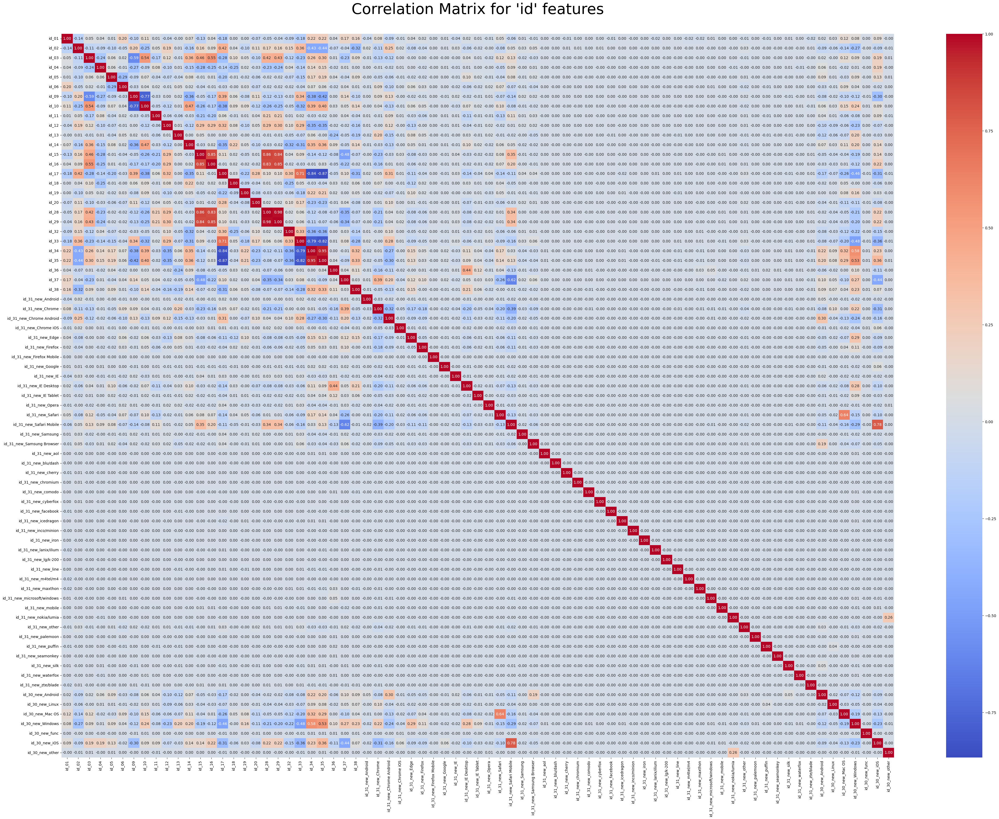

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize an empty DataFrame to store the selected columns
idxx_cols = pd.DataFrame()

# Iterate through the columns in traindata_cleaned
for col in traindata_cleaned.columns:
    # Check if the column name starts with "id_"
    if col.startswith("id_"):
        # Add the column to the new DataFrame
        idxx_cols[col] = traindata_cleaned[col]

# Calculate the correlation matrix
corr_matx_idxx = idxx_cols.corr()

# Set the figure size
plt.figure(figsize=(50, 35))

# Create a heatmap of the correlation matrix
sns.heatmap(corr_matx_idxx, annot=True, cmap='coolwarm', fmt=".2f")

# Set the title of the plot
plt.title("Correlation Matrix for 'id' features\n", fontsize=40)

# Show the plot
plt.show()

In [11]:
# Assuming you have a binary classification problem with target variable 'isFraud' (0 for majority, 1 for minority)
# Separate the features and target variable
X = traindata_cleaned.drop('isFraud', axis=1)
y = traindata_cleaned['isFraud']

In [12]:
from sklearn.model_selection import train_test_split

# Split the resampled data into training, testing, and validation sets
X_train, X_temp, y_train, y_temp = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Check the shapes of the resulting datasets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("X_val shape:", X_val.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)
print("y_val shape:", y_val.shape)

NameError: name 'X_resampled' is not defined

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss, TomekLinks

# Assuming you have a binary classification problem with target variable 'isFraud' (0 for majority, 1 for minority)
# Separate the features and target variable
X = traindata_cleaned.drop('isFraud', axis=1)
y = traindata_cleaned['isFraud']

# Split your data into training, validation, and testing sets with a 70:15:15 ratio
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Perform a baseline training and evaluation on the imbalanced dataset:
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_val)

print("Baseline Accuracy on Validation Set:", accuracy_score(y_val, y_pred))
print("\nClassification Report on Validation Set:\n", classification_report(y_val, y_pred))

Baseline Accuracy on Validation Set: 0.9626068869886758

Classification Report on Validation Set:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98     19939
           1       0.91      0.58      0.71      1696

    accuracy                           0.96     21635
   macro avg       0.94      0.79      0.84     21635
weighted avg       0.96      0.96      0.96     21635



In [14]:
# Now, you can balance your training dataset using different sampling techniques:
# Choose and apply the desired sampling technique (e.g., Random Over-sampling, SMOTE, etc.) to X_train and y_train
# Example:
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(X_train, y_train)

# Train and evaluate your model(s) on the resampled dataset(s):
clf_ros = RandomForestClassifier(random_state=42)
clf_ros.fit(X_resampled, y_resampled)
y_pred_ros = clf_ros.predict(X_val)

print("Random over-sampling Accuracy on Validation Set:", accuracy_score(y_val, y_pred_ros))
print("\nClassification Report on Validation Set (ROS):\n", classification_report(y_val, y_pred_ros))

Random over-sampling Accuracy on Validation Set: 0.9639473076034204

Classification Report on Validation Set (ROS):
               precision    recall  f1-score   support

           0       0.97      0.99      0.98     19939
           1       0.89      0.61      0.73      1696

    accuracy                           0.96     21635
   macro avg       0.93      0.80      0.85     21635
weighted avg       0.96      0.96      0.96     21635



In [15]:
%%time

from sklearn.preprocessing import MinMaxScaler

# Initialize Min-Max Scaler
minmax_scaler = MinMaxScaler()

# Normalize using Min-Max Scaling (scaling features to the [0, 1] range)
X_scaled = minmax_scaler.fit_transform(X)

# Now, X_scaled contains the normalized features, and y contains the target variable.

CPU times: user 459 ms, sys: 679 ms, total: 1.14 s
Wall time: 1.41 s


In [191]:
%%time

from imblearn.combine import SMOTEENN

# Initialize SMOTEENN with ENN-TL
smote_enn = SMOTEENN(sampling_strategy='auto', random_state=42)

# Apply SMOTEENN to your data
X_resampled, y_resampled = smote_enn.fit_resample(X_scaled, y)

# X_resampled and y_resampled now contain the balanced dataset with ENN-TL

CPU times: user 1h 51min 50s, sys: 1min 8s, total: 1h 52min 58s
Wall time: 15min 39s


In [192]:
# Check the class distribution of the target variable after resampling
class_distribution = pd.Series(y_resampled).value_counts()

# Display the class distribution
print(class_distribution)

isFraud
1    132329
0    113927
Name: count, dtype: int64


In [10]:
# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(class_distribution, labels=class_distribution.index, autopct='%1.1f%%', colors=['skyblue', 'lightcoral'])
plt.title('Class Distribution After Resampling\n')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

NameError: name 'class_distribution' is not defined

<Figure size 600x600 with 0 Axes>

In [197]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Create an XGBoost classifier
xgb_classifier = xgb.XGBClassifier(random_state=42)

# Train the classifier on the training data
xgb_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = xgb_classifier.predict(X_test)

# Calculate accuracy on the test data
accuracy = accuracy_score(y_test, y_pred)
print("\nAccuracy:", accuracy)

# Generate a classification report
report = classification_report(y_test, y_pred)
print("\nClassification Report:\n", report)

Accuracy: 0.9850289674589853

Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     17008
           1       0.99      0.98      0.99     19930

    accuracy                           0.99     36938
   macro avg       0.98      0.99      0.98     36938
weighted avg       0.99      0.99      0.99     36938



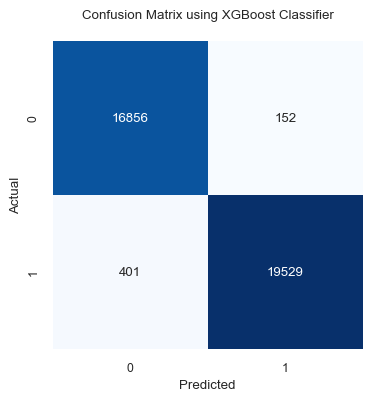

In [213]:
# Create a confusion matrix
confusion_mat = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(confusion_mat, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=xgb_classifier.classes_, yticklabels=xgb_classifier.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix using XGBoost Classifier\n")
plt.show()

In [214]:
# Make predictions on the validation data
y_val_pred = xgb_classifier.predict(X_val)

# Calculate accuracy on the validation data
val_accuracy = accuracy_score(y_val, y_val_pred)
print("\nValidation Accuracy:", val_accuracy)

# Generate a classification report for the validation data
val_report = classification_report(y_val, y_val_pred)
print("\nValidation Classification Report:\n", val_report)


Validation Accuracy: 0.9852730176777931

Validation Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.98     17056
           1       0.99      0.98      0.99     19883

    accuracy                           0.99     36939
   macro avg       0.98      0.99      0.99     36939
weighted avg       0.99      0.99      0.99     36939



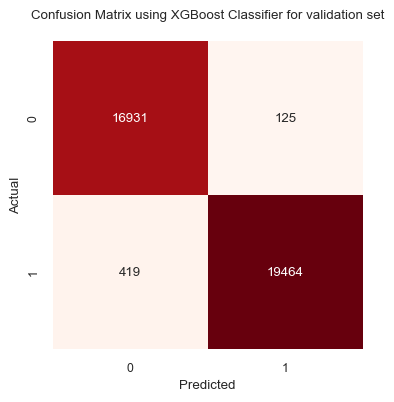

In [217]:
# Create a confusion matrix for the validation data
val_confusion_mat = confusion_matrix(y_val, y_val_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 4))
sns.set(font_scale=0.8)
sns.heatmap(val_confusion_mat, annot=True, fmt="d", cmap="Reds", cbar=False,
            xticklabels=xgb_classifier.classes_, yticklabels=xgb_classifier.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix using XGBoost Classifier for validation set\n")
plt.show()

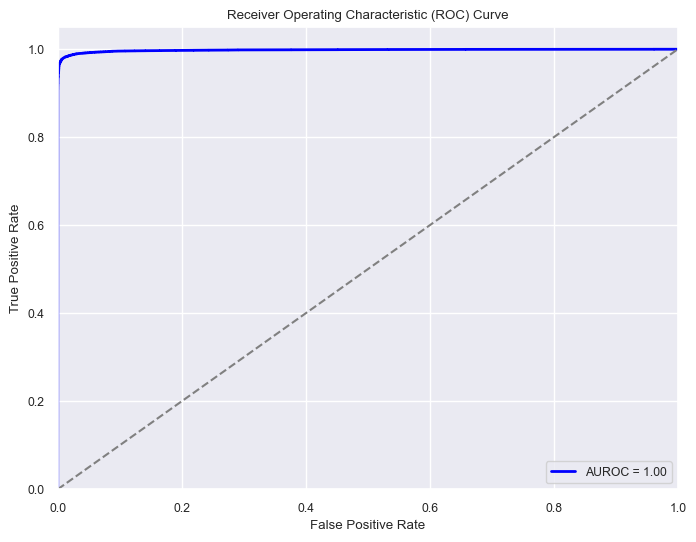

In [218]:
from sklearn.metrics import roc_curve, roc_auc_score

# Get predicted probabilities for the positive class (class 1)
y_pred_proba = xgb_classifier.predict_proba(X_test)[:, 1]

# Calculate the AUROC score
auroc_score = roc_auc_score(y_test, y_pred_proba)

# Calculate the ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot the AUROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'AUROC = {auroc_score:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [219]:
import xgboost as xgb
from sklearn.model_selection import cross_val_score, StratifiedKFold
import numpy as np

# Create an XGBoost classifier
xgb_classifier = xgb.XGBClassifier(random_state=42)

# Define the number of folds for cross-validation
num_folds = 5  # You can adjust this number as needed

# Create a stratified k-fold cross-validation splitter
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation
cross_val_scores = cross_val_score(xgb_classifier, X_train, y_train, cv=stratified_kfold, scoring='accuracy')

# Print the cross-validation scores for each fold
for fold, score in enumerate(cross_val_scores, start=1):
    print(f"Fold {fold} Accuracy: {score:.4f}")

# Calculate the mean and standard deviation of the cross-validation scores
mean_accuracy = np.mean(cross_val_scores)
std_accuracy = np.std(cross_val_scores)

print(f"\nMean Accuracy: {mean_accuracy:.4f}")
print(f"Standard Deviation: {std_accuracy:.4f}")

# Now, you can train the model on the entire training dataset and evaluate it on the test set
xgb_classifier.fit(X_train, y_train)
y_pred_test = xgb_classifier.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred_test)
print(f"\nTest Set Accuracy: {test_accuracy:.4f}")

Fold 1 Accuracy: 0.9847
Fold 2 Accuracy: 0.9852
Fold 3 Accuracy: 0.9843
Fold 4 Accuracy: 0.9851
Fold 5 Accuracy: 0.9850

Mean Accuracy: 0.9849
Standard Deviation: 0.0003

Test Set Accuracy: 0.9850
